In [210]:
import torch
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt

In [211]:
!pwd

/kaggle/working


In [212]:
# import tarfile
# from pathlib import Path

# if Path("data").exists() == False:
#     tar = tarfile.open("dentalData.tar")
#     tar.extractall("data")
#     tar.close()

## Custom Dataset

In [213]:
from torch.utils.data import Dataset
from pathlib import Path
from PIL import Image, ImageDraw
import numpy as np
import json




class DentalDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        super().__init__()

        self.data_dir = Path(data_dir)

        self.all_img_paths = list(data_dir.glob("train/img/*"))
        # self.all_mask_paths = list(data_dir.glob("train/ann/*"))
        self.transform = transform

    def __len__(self):
        return len(self.all_img_paths)


    def __getitem__(self, index):

        img_pth = self.all_img_paths[index]
        image = Image.open(img_pth)
        img_array = np.array(image)

        mask_path = self.data_dir / Path("train/ann") / Path(f"{img_pth.name}.json")

        with open(mask_path, 'rb') as file:
            masks = json.load(file)
            masks = masks["objects"]

        raw_mask = Image.new('L', img_array.shape[:-1][::-1], 0)

        for tooth in masks:
            pts = tooth["points"]["exterior"]
            ImageDraw.Draw(raw_mask).polygon(pts, outline=1, fill=1)

        if self.transform != None:

            img_array, raw_mask = self.transform(img_array, raw_mask)

        return (img_array, raw_mask)


## Model Parts

In [214]:
import torch
from torch import nn
import torchvision

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

        )

    def forward(self, x : torch.Tensor):
        return self.conv(x)


class UNET(nn.Module):

    def __init__(self, in_channels=3, out_channels=1, features=[64, 128, 256, 512]):
        super().__init__()

        self.downs = nn.ModuleList()
        self.ups = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=(2, 2), stride=2)

        for feature in features:
            self.downs.append(
                DoubleConv(in_channels, feature)
            )
            in_channels = feature

        for feature in reversed(features):
            self.ups.append(
                    nn.ConvTranspose2d(feature*2, feature, kernel_size=2, stride=2)
                    )
            self.ups.append(DoubleConv(in_channels=feature*2, out_channels=feature))

        self.bottleneck = DoubleConv(features[-1], out_channels=features[-1]*2)

        self.final_conv = nn.Conv2d(features[0], out_channels=out_channels, kernel_size=3, padding=1, stride=1)


    def forward(self, x : torch.Tensor):
        skip_connections : list[torch.Tensor] = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)

        skip_connections = skip_connections[::-1]


        for i in range(0, len(self.ups), 2):
            x = self.ups[i](x)

            if x.shape != skip_connections[i//2].shape:
                x = torchvision.transforms.Resize(skip_connections[i//2].shape[2:])(x)

            concat_skip = torch.cat([x, skip_connections[i//2]], dim=1)
            x = self.ups[i+1](concat_skip)

        return self.final_conv(x)

# Main

## Plot

In [215]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [216]:
!pwd

/kaggle/working


(4000, 6000, 3)

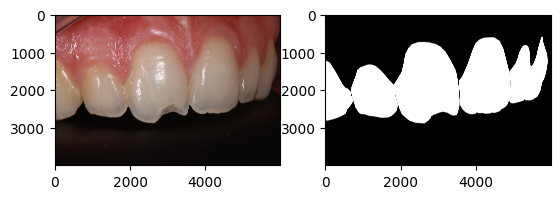

In [217]:
main_path = Path("/kaggle/input/dental")

data = DentalDataset(data_dir=main_path)

im, m = data[10]

plt.subplot(1, 2, 1)
plt.imshow(im)

plt.subplot(1, 2, 2)
plt.imshow(m, cmap=plt.cm.gray)

im.shape

## Model Instantiation

In [218]:
model = UNET(3, 1)

x = torch.randn(12, 3, 160, 240)

model.eval()
with torch.inference_mode():
    output = model(x)

if torch.cuda.device_count() > 1:
    model = torch.nn.DataParallel(model)

model.to(device)

output.shape

torch.Size([12, 1, 160, 240])

In [219]:
%pip install torchinfo

Note: you may need to restart the kernel to use updated packages.


In [220]:
from torchinfo import summary

summary(model, input_data=x.to(device))

Layer (type:depth-idx)                        Output Shape              Param #
DataParallel                                  [12, 1, 160, 240]         --
├─UNET: 1-1                                   [6, 1, 160, 240]          31,041,089
├─UNET: 1-4                                   --                        (recursive)
│    └─ModuleList: 2-16                       --                        (recursive)
│    │    └─DoubleConv: 3-1                   [6, 64, 160, 240]         38,912
│    │    └─DoubleConv: 3-8                   --                        (recursive)
├─UNET: 1-3                                   [6, 1, 160, 240]          --
├─UNET: 1-4                                   --                        (recursive)
│    └─ModuleList: 2-16                       --                        (recursive)
│    │    └─DoubleConv: 3-3                   [6, 64, 160, 240]         --
│    │    └─DoubleConv: 3-8                   --                        (recursive)
│    └─MaxPool2d: 2-3        

## Transform fn

In [221]:
from torchvision.transforms import v2
import random


def train_transforms(img, mask):

    def get_random():
        return torch.rand(1).item()

    img = v2.ToImage()(img)
    mask = v2.ToImage()(mask)

    img = v2.Resize((160, 240))(img)
    mask = v2.Resize((160, 240))(mask)

    if get_random() > 0.5:
        img = v2.RandomHorizontalFlip(p=1)(img)
        mask = v2.RandomHorizontalFlip(p=1)(mask)

    if get_random() > 0.5:
        img = v2.RandomVerticalFlip(p=1)(img)
        mask = v2.RandomVerticalFlip(p=1)(mask)

    img = v2.ToDtype(torch.float32, scale=True)(img)
    mask = v2.ToDtype(torch.float32, scale=True)(mask)

    return (img, mask)


In [222]:
torch.rand(1).item()

0.22271162271499634

## DataLoader

In [223]:
from torch.utils.data import DataLoader


BATCH_SIZE = 32

train_data = DentalDataset(data_dir=main_path, transform=train_transforms)

train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE)


(torch.Size([3, 160, 240]), torch.Size([1, 160, 240]))

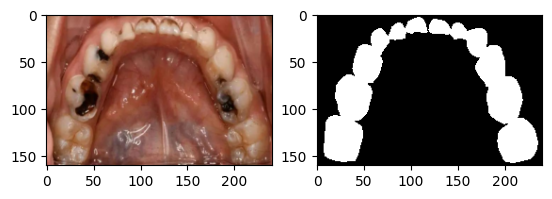

In [224]:
im_t, m_t = train_data[random.randint(0, 1000)]

plt.subplot(1, 2, 1)
plt.imshow(im_t.permute(1, 2, 0))

plt.subplot(1, 2, 2)
plt.imshow(m_t.permute(1, 2, 0), cmap=plt.cm.gray)

im_t.shape, m_t.shape

## Training

In [225]:
import torch
from tqdm import tqdm

LR = 1e-3
loss_fn = torch.nn.BCEWithLogitsLoss()

optimizer = torch.optim.Adam(params=model.parameters(), lr=LR)
lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=optimizer, milestones=[5, 15, 35, 65], gamma=0.1)

def train_step():
    loss_data = 0
    
    for batch, (img_batch, mask_batch) in enumerate(tqdm(train_dataloader)):
        torch.cuda.empty_cache()

        model.train()

        output_masks = model(img_batch.to(device))

        loss : torch.Tensor = loss_fn(output_masks, mask_batch.to(device))

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

        loss_data += loss.item()
        
        if batch % 30 == 0 and batch != 0:
            print("Loss : ", loss_data / batch, "| LR : ", lr_scheduler.get_last_lr())
    
    
            plt.subplot(1, 2, 1)
            plt.imshow(mask_batch[0].squeeze(), cmap=plt.cm.gray)
    
            plt.subplot(1, 2, 2)
            cpu_output_masks = output_masks.detach().to('cpu')
            plt.imshow(cpu_output_masks[0].squeeze(), cmap=plt.cm.gray)
    
            plt.show()
    
    model.eval()

    return loss_data / len(train_dataloader)

 48%|████▊     | 30/63 [02:25<02:43,  4.96s/it]

Loss :  0.13989623949552576 | LR :  [0.001]


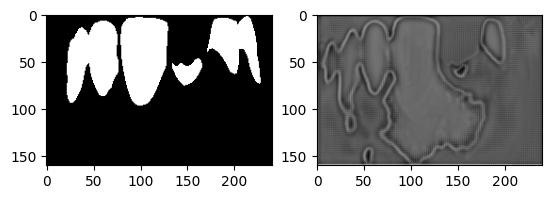

 95%|█████████▌| 60/63 [04:52<00:14,  4.74s/it]

Loss :  0.07507144399763395 | LR :  [0.001]


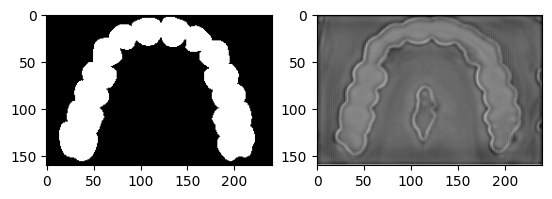

 48%|████▊     | 30/63 [02:26<02:45,  5.01s/it]

Loss :  0.009186760274072487 | LR :  [0.001]


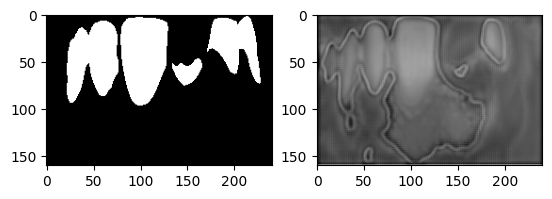

 95%|█████████▌| 60/63 [04:51<00:13,  4.66s/it]

Loss :  0.008757992996834219 | LR :  [0.001]


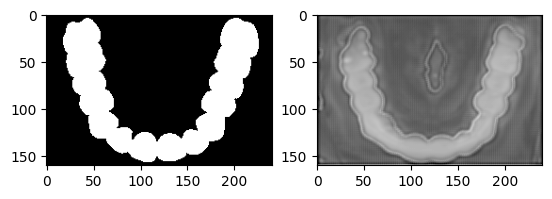

 48%|████▊     | 30/63 [02:23<02:42,  4.93s/it]

Loss :  0.008494611037895084 | LR :  [0.001]


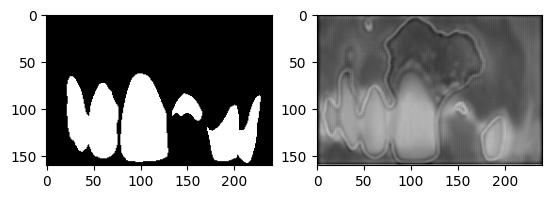

 95%|█████████▌| 60/63 [04:47<00:13,  4.63s/it]

Loss :  0.00820426109712571 | LR :  [0.001]


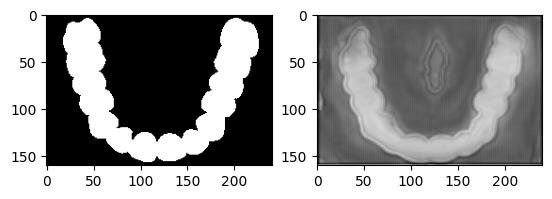

 48%|████▊     | 30/63 [02:24<02:43,  4.95s/it]

Loss :  0.008204096571231882 | LR :  [0.001]


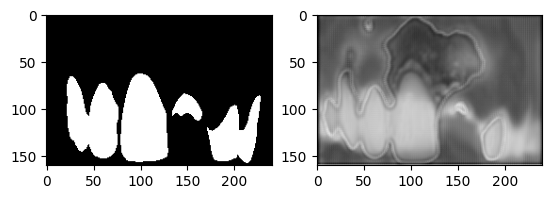

 95%|█████████▌| 60/63 [04:47<00:13,  4.65s/it]

Loss :  0.007953945376599828 | LR :  [0.001]


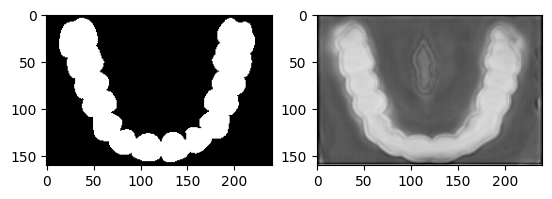

 48%|████▊     | 30/63 [02:23<02:42,  4.91s/it]

Loss :  0.008058050942296783 | LR :  [0.001]


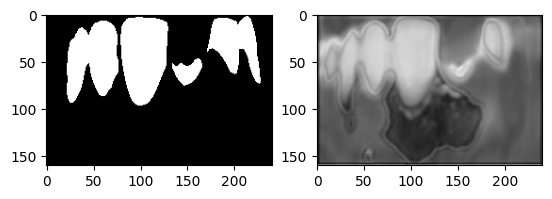

 95%|█████████▌| 60/63 [04:48<00:14,  4.73s/it]

Loss :  0.007821685976038377 | LR :  [0.001]


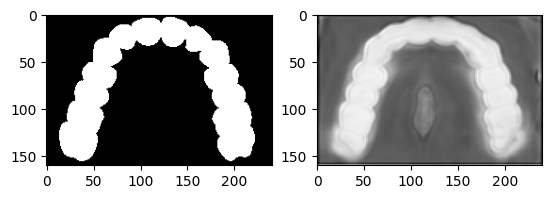

 48%|████▊     | 30/63 [02:21<02:36,  4.74s/it]

Loss :  0.00796661238806943 | LR :  [0.0001]


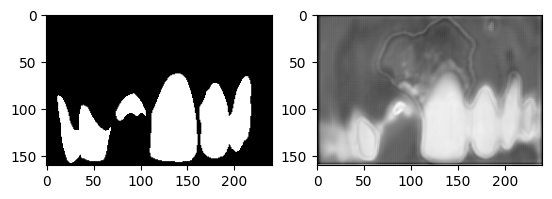

 95%|█████████▌| 60/63 [04:39<00:13,  4.51s/it]

Loss :  0.00774233591898034 | LR :  [0.0001]


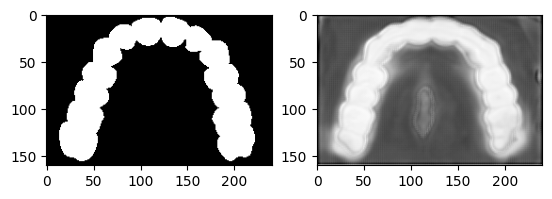

 48%|████▊     | 30/63 [02:17<02:35,  4.71s/it]

Loss :  0.007927848072722555 | LR :  [0.0001]


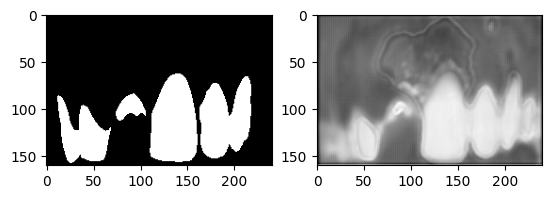

 95%|█████████▌| 60/63 [04:34<00:13,  4.46s/it]

Loss :  0.0077138406146938605 | LR :  [0.0001]


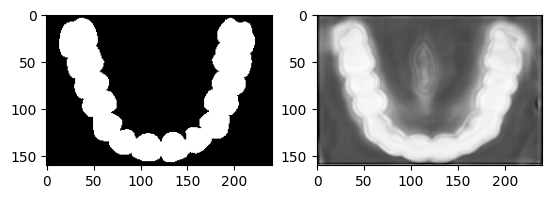

 48%|████▊     | 30/63 [02:18<02:35,  4.71s/it]

Loss :  0.007913130925347407 | LR :  [0.0001]


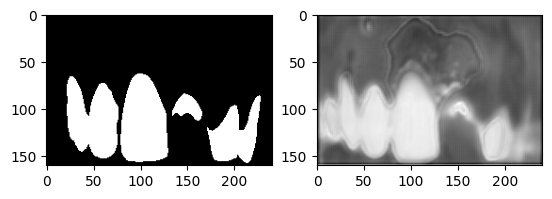

 95%|█████████▌| 60/63 [04:38<00:13,  4.53s/it]

Loss :  0.007700078010869523 | LR :  [0.0001]


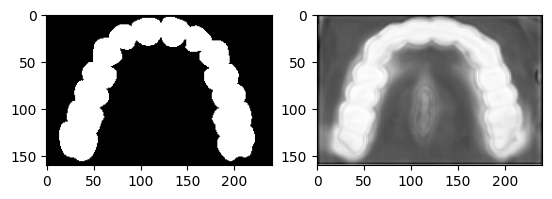

 48%|████▊     | 30/63 [02:18<02:36,  4.74s/it]

Loss :  0.007901083134735623 | LR :  [0.0001]


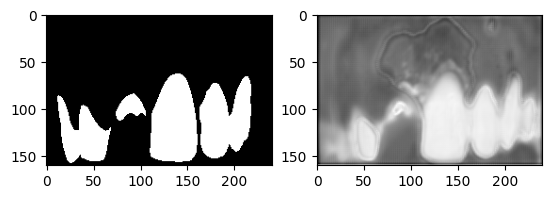

 95%|█████████▌| 60/63 [04:39<00:13,  4.55s/it]

Loss :  0.007687431022835274 | LR :  [0.0001]


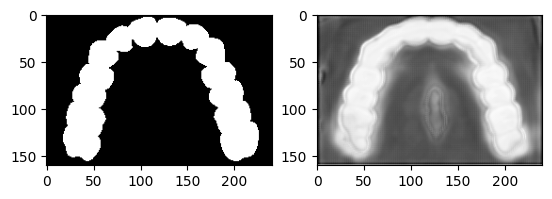

 48%|████▊     | 30/63 [02:20<02:43,  4.95s/it]

Loss :  0.007887231977656483 | LR :  [0.0001]


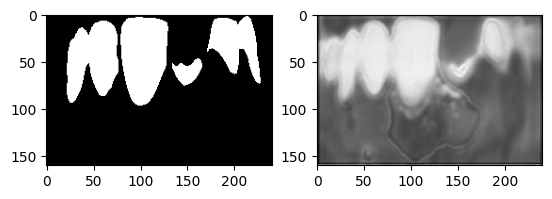

 95%|█████████▌| 60/63 [04:41<00:13,  4.48s/it]

Loss :  0.00767469808148841 | LR :  [0.0001]


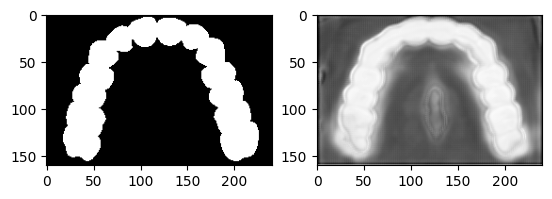

 48%|████▊     | 30/63 [02:21<02:40,  4.85s/it]

Loss :  0.007872961880639195 | LR :  [0.0001]


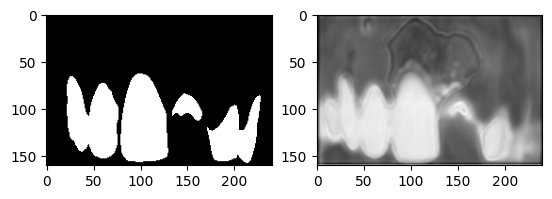

 95%|█████████▌| 60/63 [04:42<00:13,  4.61s/it]

Loss :  0.00766091572586447 | LR :  [0.0001]


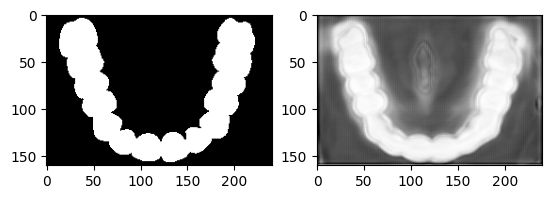

 48%|████▊     | 30/63 [02:20<02:39,  4.83s/it]

Loss :  0.007859734538942575 | LR :  [0.0001]


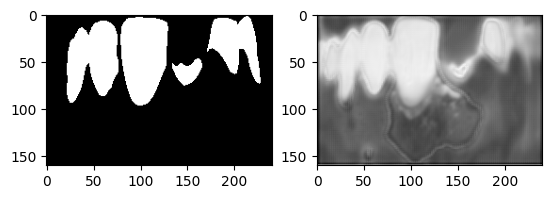

 95%|█████████▌| 60/63 [04:41<00:13,  4.46s/it]

Loss :  0.007648834446445108 | LR :  [0.0001]


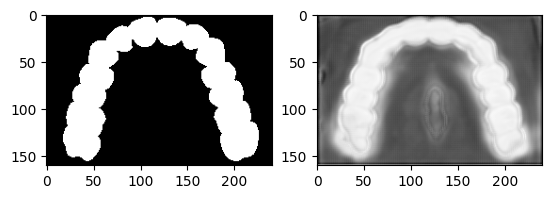

 48%|████▊     | 30/63 [02:20<02:35,  4.71s/it]

Loss :  0.007848269337167342 | LR :  [0.0001]


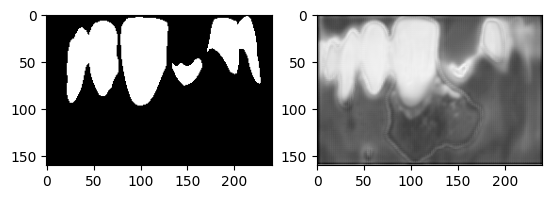

 95%|█████████▌| 60/63 [04:43<00:13,  4.60s/it]

Loss :  0.007636451620298127 | LR :  [0.0001]


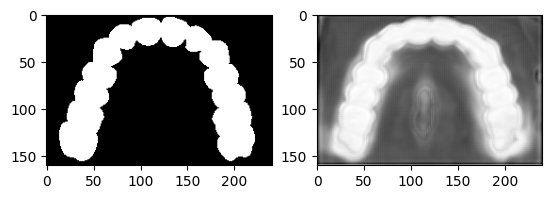

 48%|████▊     | 30/63 [02:22<02:42,  4.92s/it]

Loss :  0.007835462968796492 | LR :  [0.0001]


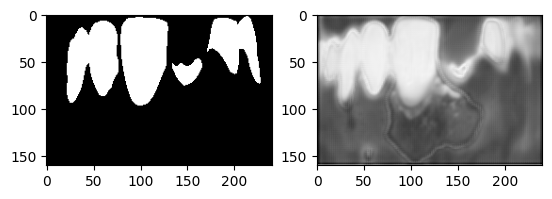

 95%|█████████▌| 60/63 [04:43<00:13,  4.50s/it]

Loss :  0.007624183890099326 | LR :  [0.0001]


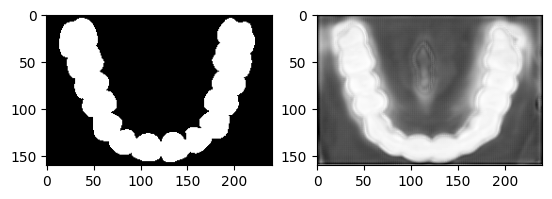

 48%|████▊     | 30/63 [02:20<02:39,  4.82s/it]

Loss :  0.007823614946876964 | LR :  [0.0001]


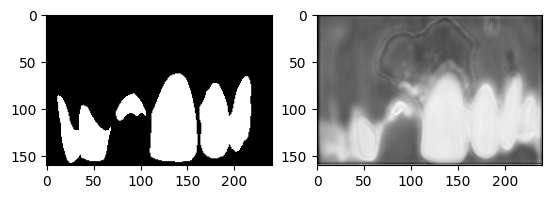

 95%|█████████▌| 60/63 [04:41<00:13,  4.51s/it]

Loss :  0.007612785945336024 | LR :  [0.0001]


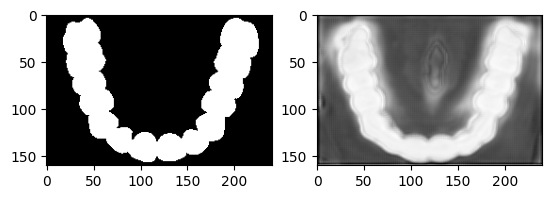

 48%|████▊     | 30/63 [02:19<02:38,  4.81s/it]

Loss :  0.007803900865837932 | LR :  [1e-05]


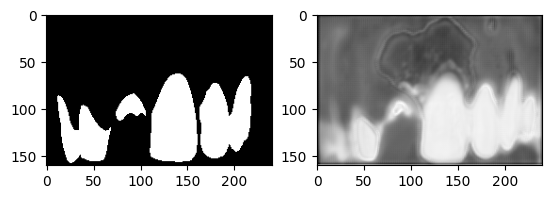

 95%|█████████▌| 60/63 [04:40<00:13,  4.49s/it]

Loss :  0.007593259386097392 | LR :  [1e-05]


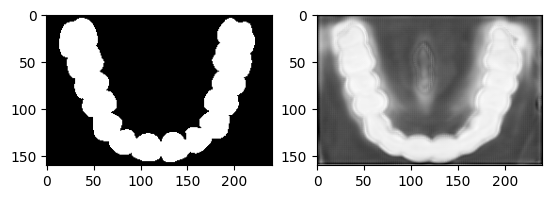

 48%|████▊     | 30/63 [02:20<02:34,  4.69s/it]

Loss :  0.0077959060824165744 | LR :  [1e-05]


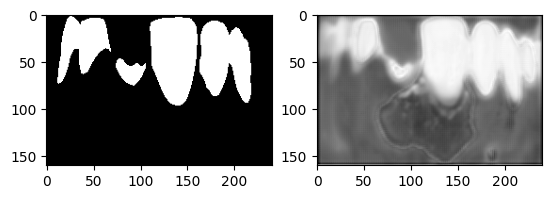

 95%|█████████▌| 60/63 [04:42<00:13,  4.65s/it]

Loss :  0.007588632117646436 | LR :  [1e-05]


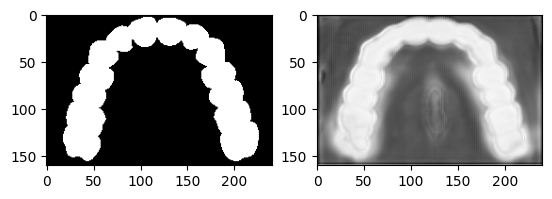

 48%|████▊     | 30/63 [02:20<02:36,  4.75s/it]

Loss :  0.00779276362930735 | LR :  [1e-05]


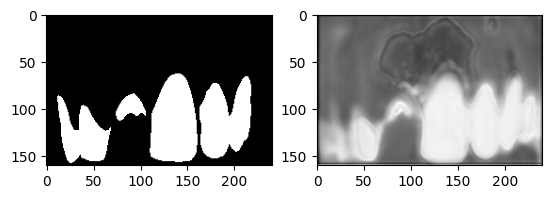

 95%|█████████▌| 60/63 [04:40<00:13,  4.51s/it]

Loss :  0.007585281762294472 | LR :  [1e-05]


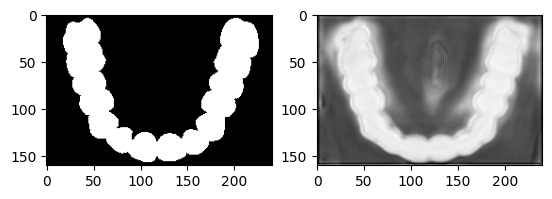

 48%|████▊     | 30/63 [02:20<02:40,  4.85s/it]

Loss :  0.007789982001607617 | LR :  [1e-05]


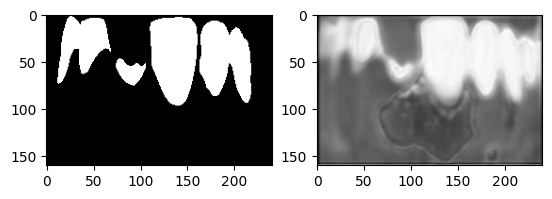

 95%|█████████▌| 60/63 [04:41<00:13,  4.56s/it]

Loss :  0.007583482485885421 | LR :  [1e-05]


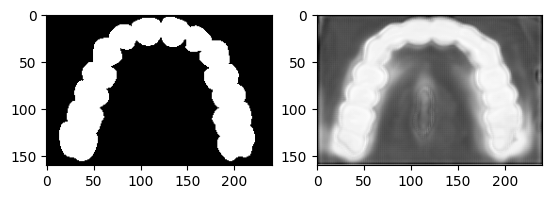

 48%|████▊     | 30/63 [02:22<02:44,  4.98s/it]

Loss :  0.007788001637284954 | LR :  [1e-05]


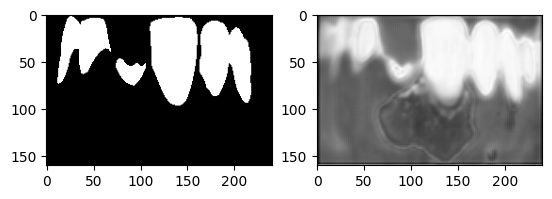

 95%|█████████▌| 60/63 [04:42<00:13,  4.54s/it]

Loss :  0.007581450277939439 | LR :  [1e-05]


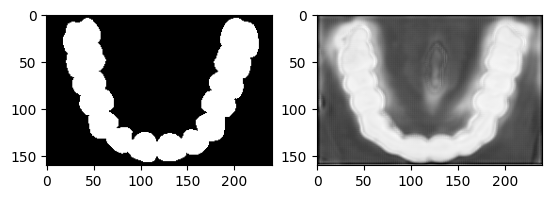

 48%|████▊     | 30/63 [02:20<02:38,  4.80s/it]

Loss :  0.007784967729821801 | LR :  [1e-05]


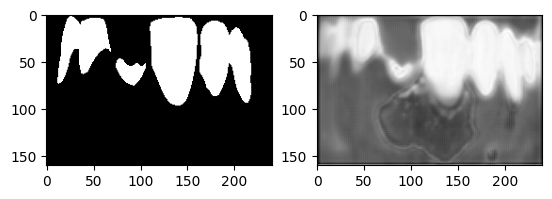

 95%|█████████▌| 60/63 [04:41<00:13,  4.47s/it]

Loss :  0.007579088249864678 | LR :  [1e-05]


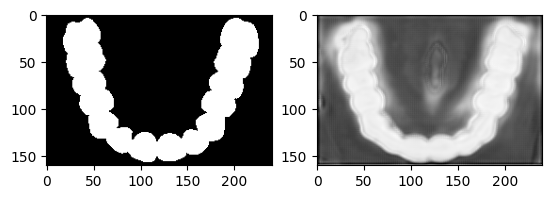

 48%|████▊     | 30/63 [02:20<02:41,  4.91s/it]

Loss :  0.0077833740195880335 | LR :  [1e-05]


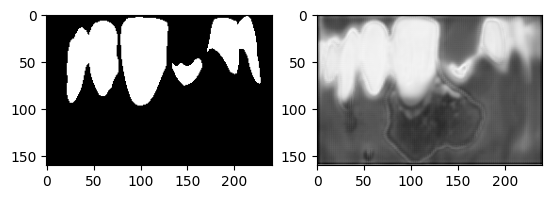

 95%|█████████▌| 60/63 [04:40<00:13,  4.54s/it]

Loss :  0.0075771912233904 | LR :  [1e-05]


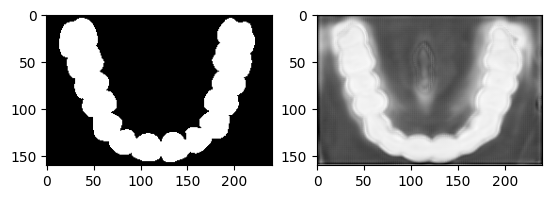

 48%|████▊     | 30/63 [02:20<02:35,  4.73s/it]

Loss :  0.007781875568131606 | LR :  [1e-05]


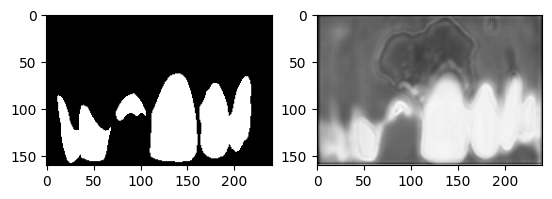

 95%|█████████▌| 60/63 [04:41<00:13,  4.60s/it]

Loss :  0.007575744832865894 | LR :  [1e-05]


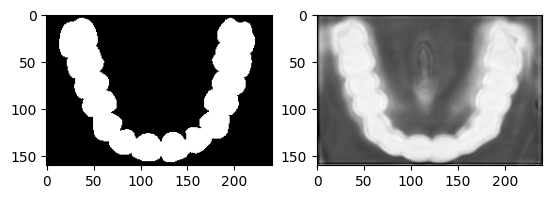

 48%|████▊     | 30/63 [02:20<02:37,  4.78s/it]

Loss :  0.007779596404482921 | LR :  [1e-05]


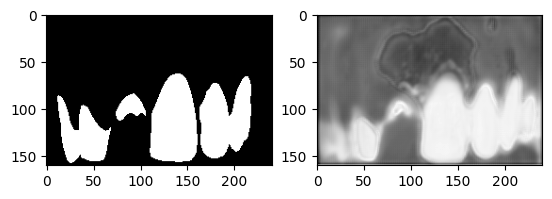

 95%|█████████▌| 60/63 [04:42<00:13,  4.65s/it]

Loss :  0.0075738225054616725 | LR :  [1e-05]


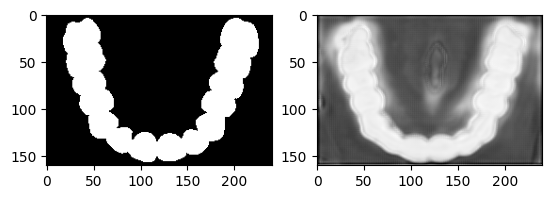

 48%|████▊     | 30/63 [02:21<02:42,  4.94s/it]

Loss :  0.007776592082033555 | LR :  [1e-05]


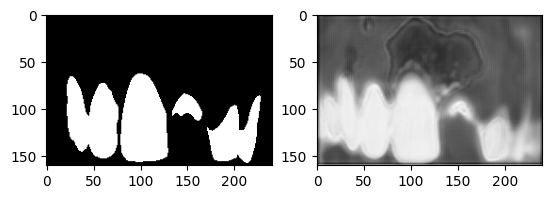

 95%|█████████▌| 60/63 [04:42<00:13,  4.49s/it]

Loss :  0.007571027140753964 | LR :  [1e-05]


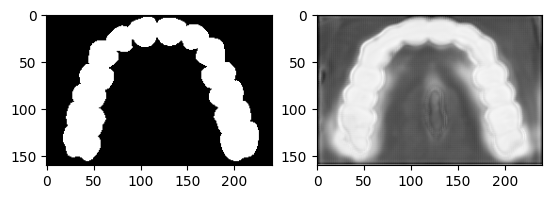

 48%|████▊     | 30/63 [02:22<02:42,  4.93s/it]

Loss :  0.007775469015662869 | LR :  [1e-05]


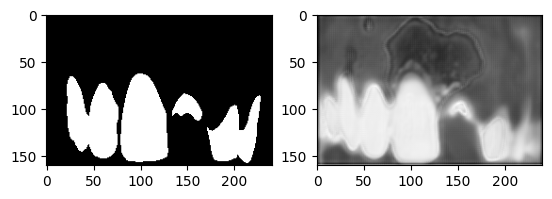

 95%|█████████▌| 60/63 [04:45<00:13,  4.49s/it]

Loss :  0.007570124619329969 | LR :  [1e-05]


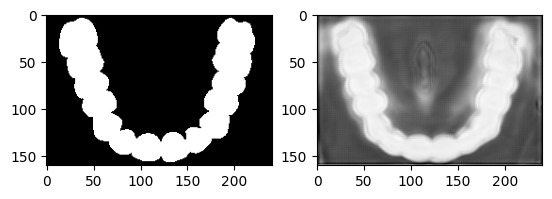

 48%|████▊     | 30/63 [02:20<02:36,  4.76s/it]

Loss :  0.007773763313889503 | LR :  [1e-05]


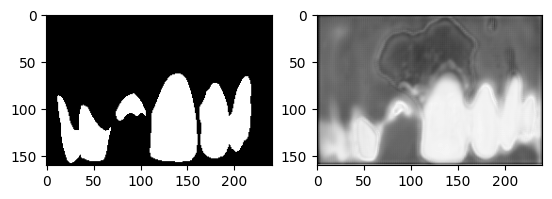

 95%|█████████▌| 60/63 [04:42<00:14,  4.70s/it]

Loss :  0.007567336744007965 | LR :  [1e-05]


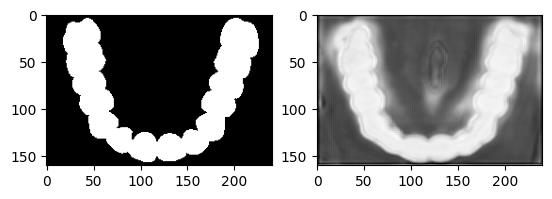

 48%|████▊     | 30/63 [02:20<02:39,  4.83s/it]

Loss :  0.007770532074694832 | LR :  [1e-05]


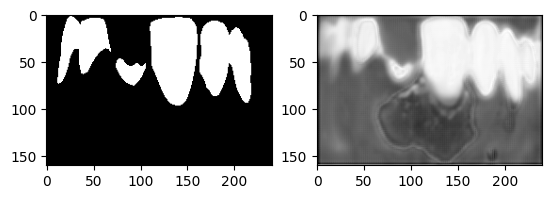

 95%|█████████▌| 60/63 [04:42<00:13,  4.61s/it]

Loss :  0.007565238551857571 | LR :  [1e-05]


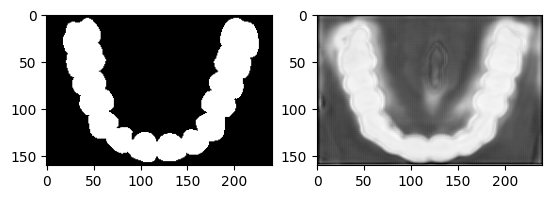

 48%|████▊     | 30/63 [02:21<02:41,  4.89s/it]

Loss :  0.007769060336674253 | LR :  [1e-05]


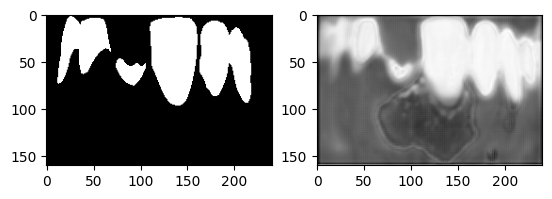

 95%|█████████▌| 60/63 [04:45<00:14,  4.67s/it]

Loss :  0.0075632996624335645 | LR :  [1e-05]


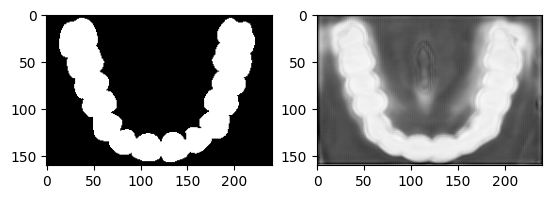

 48%|████▊     | 30/63 [02:21<02:41,  4.90s/it]

Loss :  0.007765561481937766 | LR :  [1e-05]


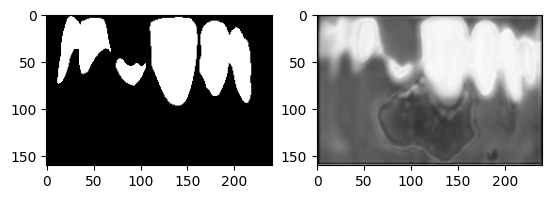

 95%|█████████▌| 60/63 [04:43<00:13,  4.59s/it]

Loss :  0.007560775359161198 | LR :  [1e-05]


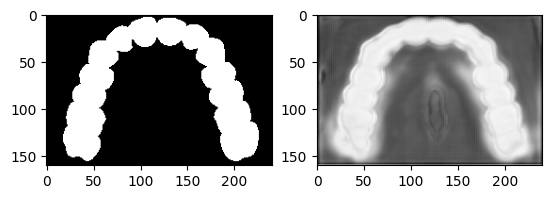

 48%|████▊     | 30/63 [02:20<02:40,  4.85s/it]

Loss :  0.0077641048313428955 | LR :  [1e-05]


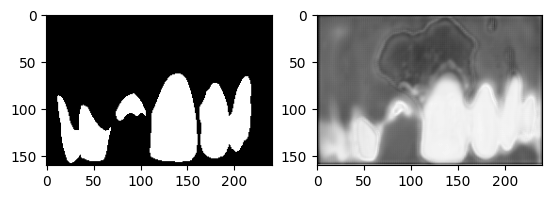

 95%|█████████▌| 60/63 [04:42<00:13,  4.65s/it]

Loss :  0.007558967460257312 | LR :  [1e-05]


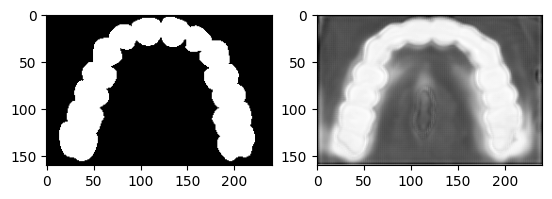

 48%|████▊     | 30/63 [02:21<02:41,  4.88s/it]

Loss :  0.007762550081436833 | LR :  [1e-05]


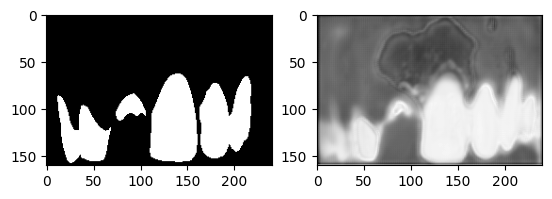

 95%|█████████▌| 60/63 [04:43<00:13,  4.60s/it]

Loss :  0.007556947367265821 | LR :  [1e-05]


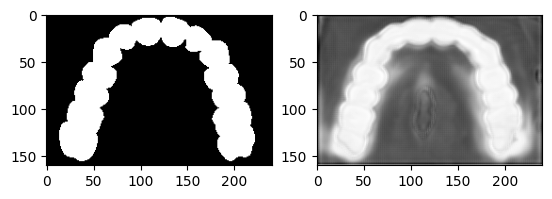

 48%|████▊     | 30/63 [02:20<02:41,  4.90s/it]

Loss :  0.007759071638186773 | LR :  [1e-05]


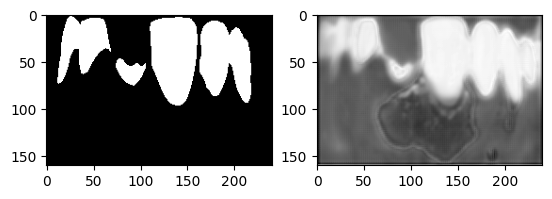

 95%|█████████▌| 60/63 [04:42<00:14,  4.73s/it]

Loss :  0.007554271056627234 | LR :  [1e-05]


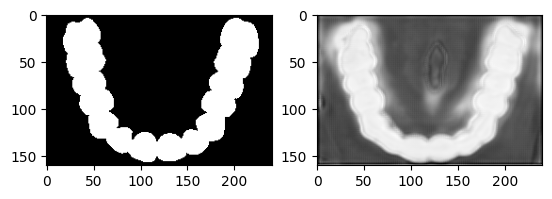

 48%|████▊     | 30/63 [02:21<02:44,  4.98s/it]

Loss :  0.007757075674210985 | LR :  [1e-05]


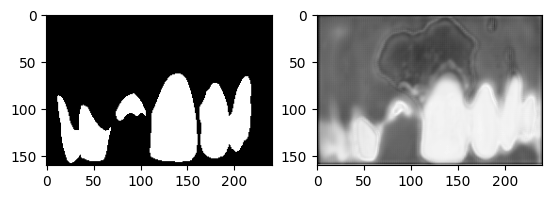

 95%|█████████▌| 60/63 [04:42<00:13,  4.37s/it]

Loss :  0.007551969261839986 | LR :  [1e-05]


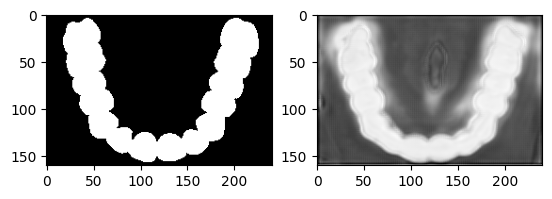

 48%|████▊     | 30/63 [02:20<02:39,  4.82s/it]

Loss :  0.0077540824500223005 | LR :  [1e-05]


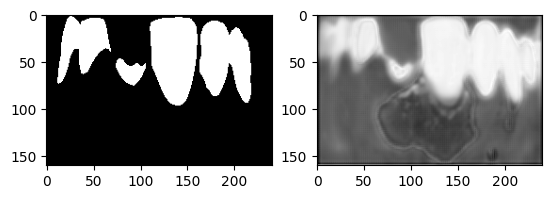

 95%|█████████▌| 60/63 [04:41<00:13,  4.58s/it]

Loss :  0.007549210404977203 | LR :  [1e-05]


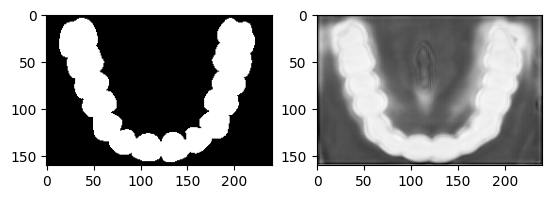

 48%|████▊     | 30/63 [02:21<02:42,  4.92s/it]

Loss :  0.0077520558765778935 | LR :  [1.0000000000000002e-06]


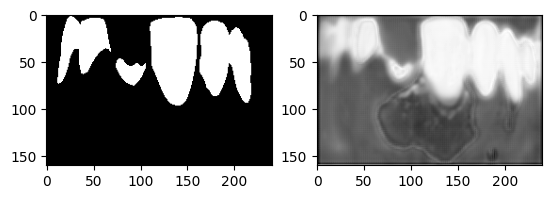

 95%|█████████▌| 60/63 [04:44<00:14,  4.67s/it]

Loss :  0.007546168092327814 | LR :  [1.0000000000000002e-06]


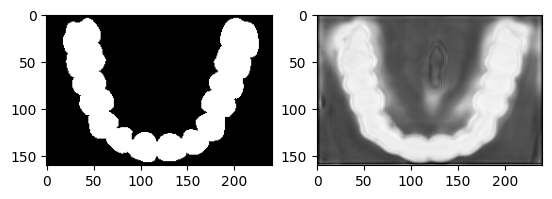

 48%|████▊     | 30/63 [02:21<02:39,  4.82s/it]

Loss :  0.007749926547209422 | LR :  [1.0000000000000002e-06]


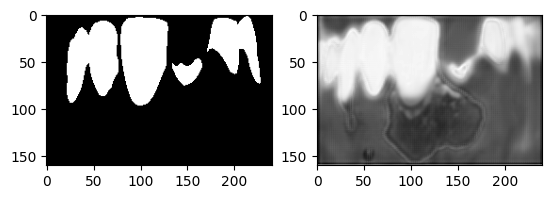

 95%|█████████▌| 60/63 [04:45<00:13,  4.55s/it]

Loss :  0.007544702935653428 | LR :  [1.0000000000000002e-06]


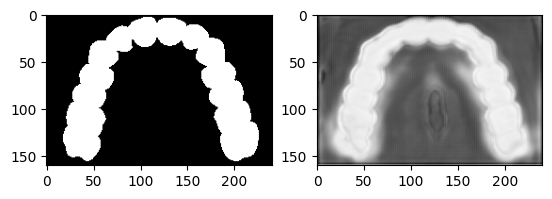

 48%|████▊     | 30/63 [02:22<02:43,  4.95s/it]

Loss :  0.007748459372669459 | LR :  [1.0000000000000002e-06]


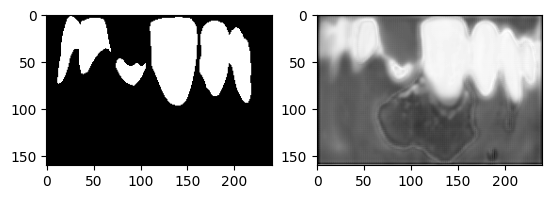

 95%|█████████▌| 60/63 [04:45<00:14,  4.67s/it]

Loss :  0.007543841446749866 | LR :  [1.0000000000000002e-06]


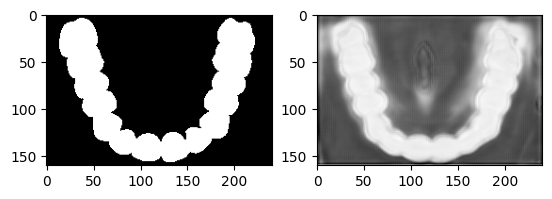

 48%|████▊     | 30/63 [02:20<02:39,  4.83s/it]

Loss :  0.007749636160830657 | LR :  [1.0000000000000002e-06]


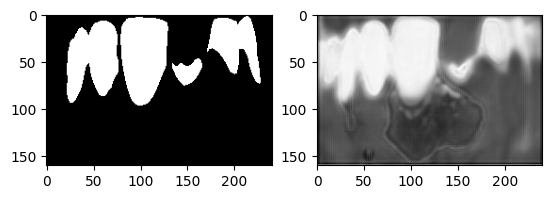

 95%|█████████▌| 60/63 [04:42<00:13,  4.60s/it]

Loss :  0.007544878117429713 | LR :  [1.0000000000000002e-06]


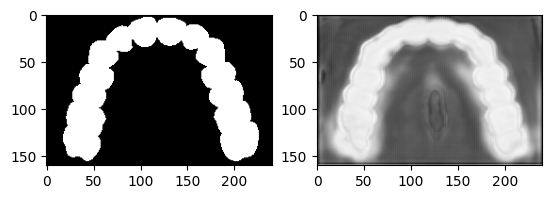

 48%|████▊     | 30/63 [02:21<02:38,  4.82s/it]

Loss :  0.007749859259153406 | LR :  [1.0000000000000002e-06]


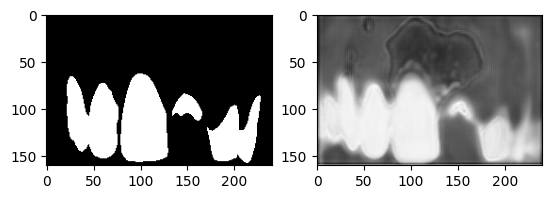

 95%|█████████▌| 60/63 [04:44<00:13,  4.57s/it]

Loss :  0.007544646699291964 | LR :  [1.0000000000000002e-06]


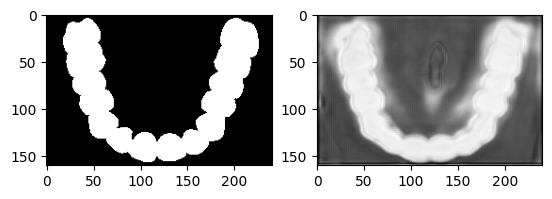

 48%|████▊     | 30/63 [02:22<02:45,  5.01s/it]

Loss :  0.00774884798253576 | LR :  [1.0000000000000002e-06]


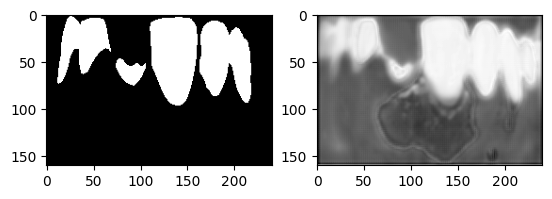

 95%|█████████▌| 60/63 [04:44<00:13,  4.60s/it]

Loss :  0.007543557121728857 | LR :  [1.0000000000000002e-06]


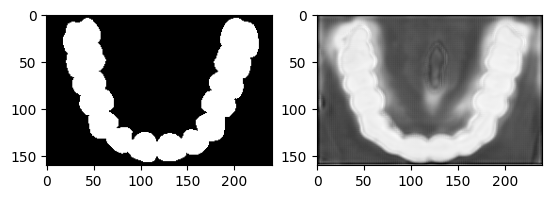

 48%|████▊     | 30/63 [02:21<02:44,  4.99s/it]

Loss :  0.007748562563210726 | LR :  [1.0000000000000002e-06]


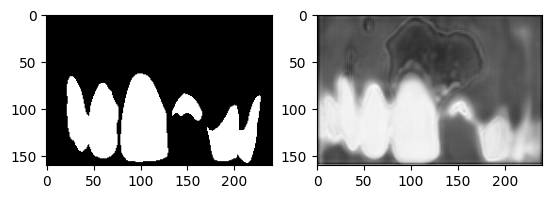

 95%|█████████▌| 60/63 [04:44<00:13,  4.48s/it]

Loss :  0.007543295163971683 | LR :  [1.0000000000000002e-06]


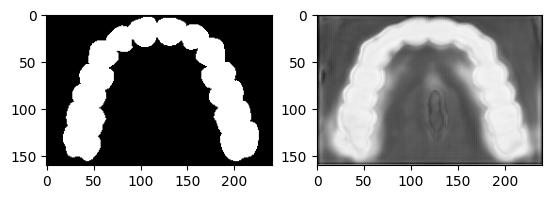

 48%|████▊     | 30/63 [02:21<02:38,  4.81s/it]

Loss :  0.0077487151448925335 | LR :  [1.0000000000000002e-06]


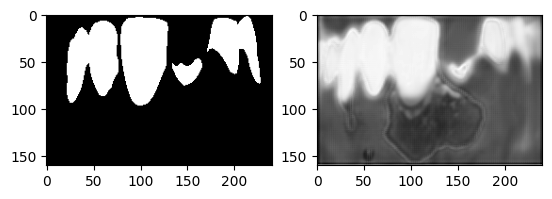

 95%|█████████▌| 60/63 [04:43<00:13,  4.55s/it]

Loss :  0.007543933034564058 | LR :  [1.0000000000000002e-06]


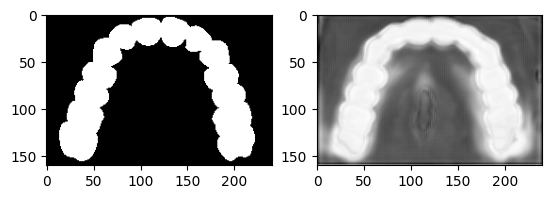

 48%|████▊     | 30/63 [02:23<02:39,  4.82s/it]

Loss :  0.007746993765855829 | LR :  [1.0000000000000002e-06]


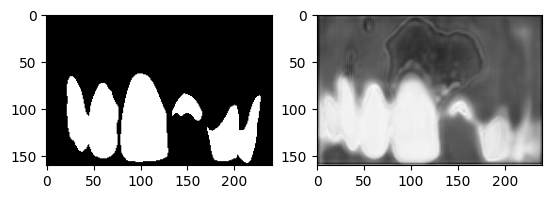

 95%|█████████▌| 60/63 [04:44<00:13,  4.61s/it]

Loss :  0.007542238718209167 | LR :  [1.0000000000000002e-06]


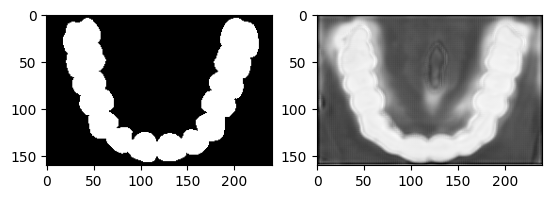

 48%|████▊     | 30/63 [02:20<02:39,  4.82s/it]

Loss :  0.007747445193429788 | LR :  [1.0000000000000002e-06]


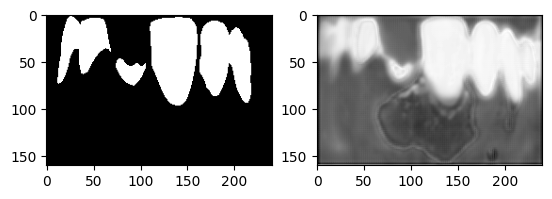

 95%|█████████▌| 60/63 [04:41<00:13,  4.51s/it]

Loss :  0.007542437625428041 | LR :  [1.0000000000000002e-06]


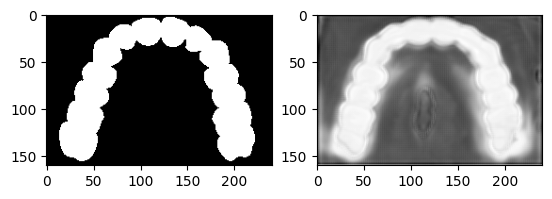

 48%|████▊     | 30/63 [02:21<02:37,  4.77s/it]

Loss :  0.007746553064013521 | LR :  [1.0000000000000002e-06]


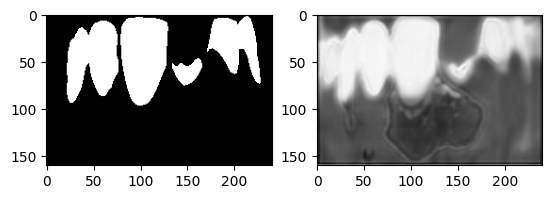

 95%|█████████▌| 60/63 [04:43<00:13,  4.63s/it]

Loss :  0.007541829852076868 | LR :  [1.0000000000000002e-06]


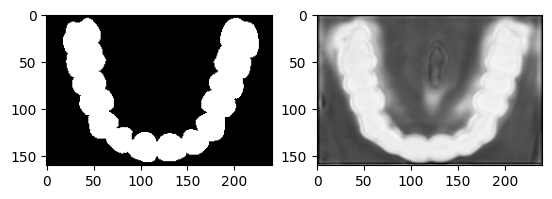

 48%|████▊     | 30/63 [02:22<02:38,  4.81s/it]

Loss :  0.00774683019456764 | LR :  [1.0000000000000002e-06]


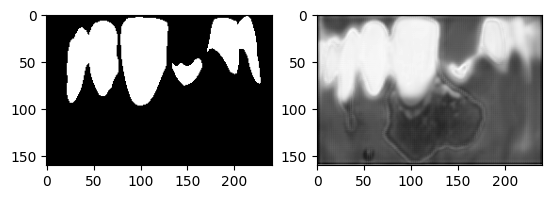

 95%|█████████▌| 60/63 [04:44<00:13,  4.52s/it]

Loss :  0.007541937730275094 | LR :  [1.0000000000000002e-06]


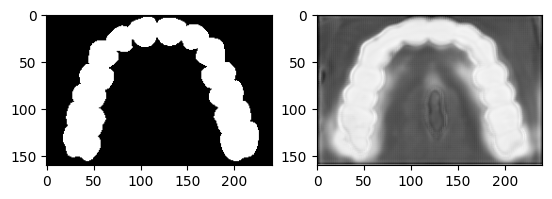

 48%|████▊     | 30/63 [02:20<02:39,  4.84s/it]

Loss :  0.00774611074787875 | LR :  [1.0000000000000002e-06]


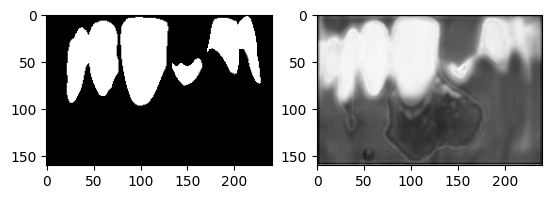

 95%|█████████▌| 60/63 [04:41<00:13,  4.65s/it]

Loss :  0.007541545371835431 | LR :  [1.0000000000000002e-06]


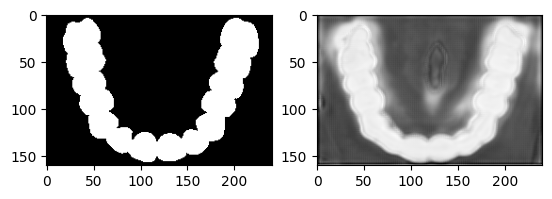

 48%|████▊     | 30/63 [02:22<02:42,  4.93s/it]

Loss :  0.007745187496766448 | LR :  [1.0000000000000002e-06]


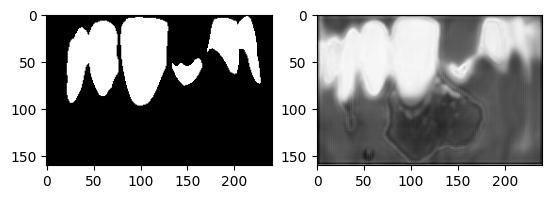

 95%|█████████▌| 60/63 [04:45<00:14,  4.71s/it]

Loss :  0.007540880663630863 | LR :  [1.0000000000000002e-06]


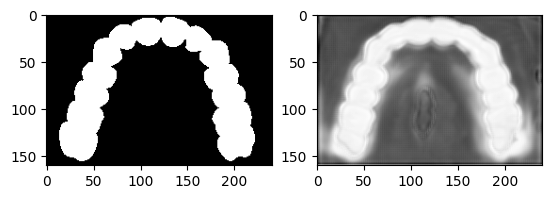

 48%|████▊     | 30/63 [02:21<02:38,  4.81s/it]

Loss :  0.007745486792797843 | LR :  [1.0000000000000002e-06]


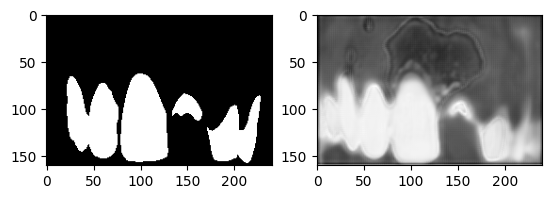

 95%|█████████▌| 60/63 [04:45<00:13,  4.63s/it]

Loss :  0.007540645729750395 | LR :  [1.0000000000000002e-06]


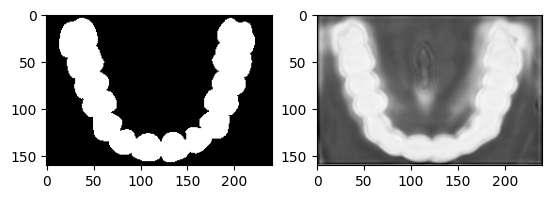

 95%|█████████▌| 60/63 [04:46<00:14,  4.67s/it]

Loss :  0.007540868665091694 | LR :  [1.0000000000000002e-06]


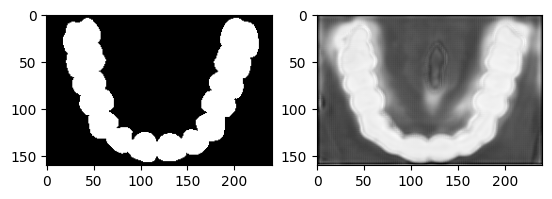

 48%|████▊     | 30/63 [02:21<02:43,  4.96s/it]

Loss :  0.007743384782224893 | LR :  [1.0000000000000002e-06]


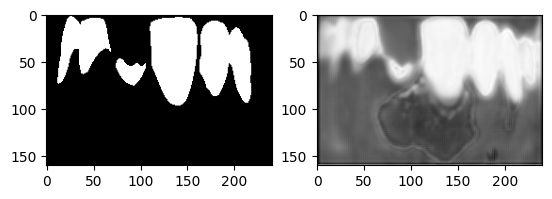

 95%|█████████▌| 60/63 [04:43<00:13,  4.55s/it]

Loss :  0.007539433334022761 | LR :  [1.0000000000000002e-06]


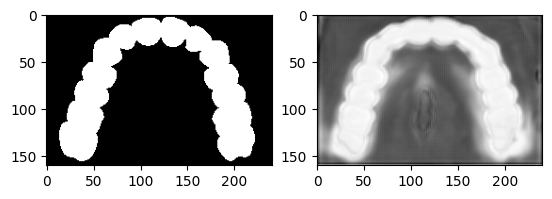

 48%|████▊     | 30/63 [02:23<02:43,  4.95s/it]

Loss :  0.00774430042753617 | LR :  [1.0000000000000002e-06]


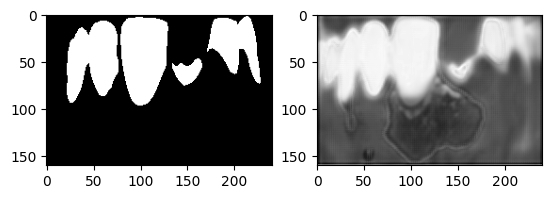

 95%|█████████▌| 60/63 [04:46<00:13,  4.64s/it]

Loss :  0.007539714500308037 | LR :  [1.0000000000000002e-06]


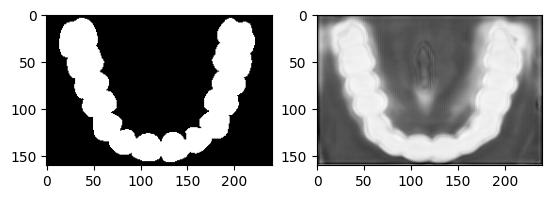

 48%|████▊     | 30/63 [02:22<02:42,  4.92s/it]

Loss :  0.007745143910869956 | LR :  [1.0000000000000002e-06]


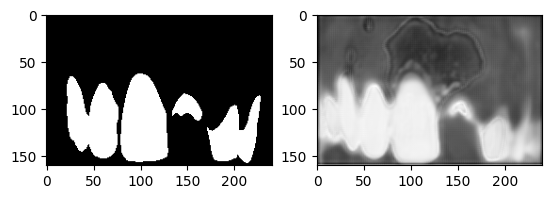

 95%|█████████▌| 60/63 [04:46<00:13,  4.54s/it]

Loss :  0.007539713429287076 | LR :  [1.0000000000000002e-06]


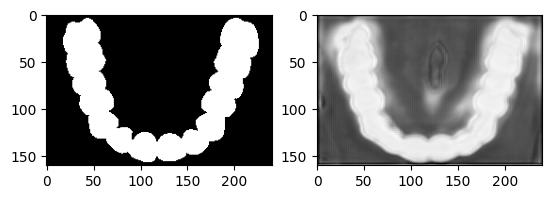

 48%|████▊     | 30/63 [02:24<02:45,  5.03s/it]

Loss :  0.007743264657134811 | LR :  [1.0000000000000002e-06]


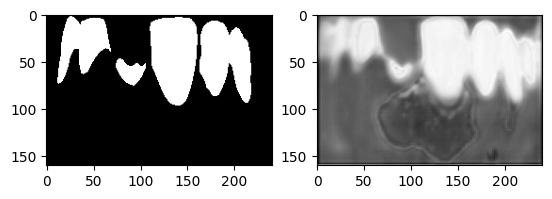

 95%|█████████▌| 60/63 [04:48<00:13,  4.63s/it]

Loss :  0.00753872519514213 | LR :  [1.0000000000000002e-06]


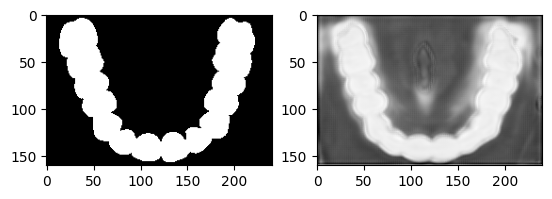

 48%|████▊     | 30/63 [02:21<02:37,  4.78s/it]

Loss :  0.007743327242011825 | LR :  [1.0000000000000002e-06]


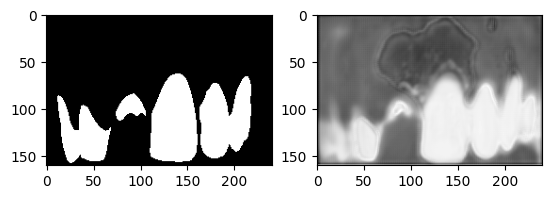

 95%|█████████▌| 60/63 [04:44<00:13,  4.66s/it]

Loss :  0.007538646459579468 | LR :  [1.0000000000000002e-06]


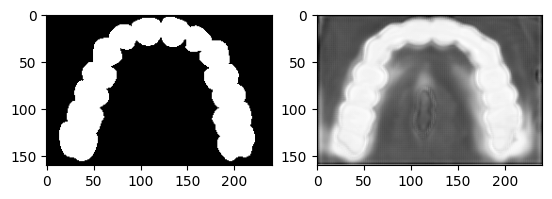

 48%|████▊     | 30/63 [02:21<02:39,  4.82s/it]

Loss :  0.00774229831683139 | LR :  [1.0000000000000002e-06]


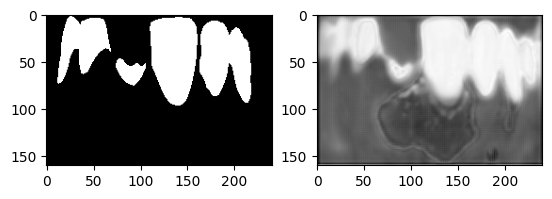

 95%|█████████▌| 60/63 [04:45<00:13,  4.53s/it]

Loss :  0.007538176537491381 | LR :  [1.0000000000000002e-06]


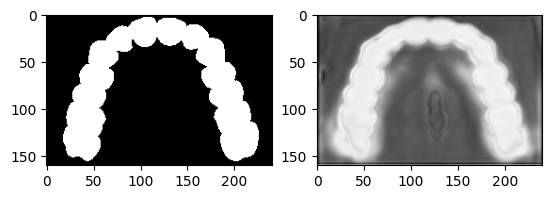

 48%|████▊     | 30/63 [02:21<02:39,  4.83s/it]

Loss :  0.0077417236597587666 | LR :  [1.0000000000000002e-06]


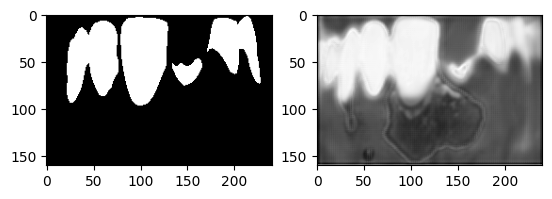

 95%|█████████▌| 60/63 [04:43<00:13,  4.61s/it]

Loss :  0.0075373321461180845 | LR :  [1.0000000000000002e-06]


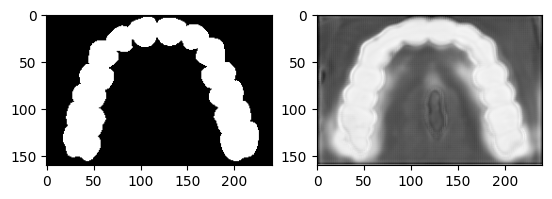

 48%|████▊     | 30/63 [02:21<02:43,  4.94s/it]

Loss :  0.007741717885558804 | LR :  [1.0000000000000002e-06]


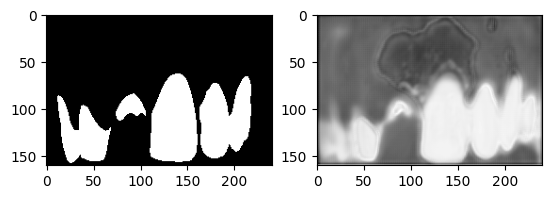

 95%|█████████▌| 60/63 [04:45<00:13,  4.54s/it]

Loss :  0.007537105151762565 | LR :  [1.0000000000000002e-06]


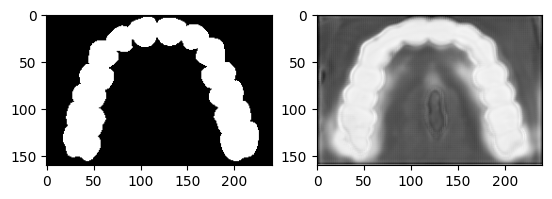

 48%|████▊     | 30/63 [02:23<02:43,  4.94s/it]

Loss :  0.007742135769998034 | LR :  [1.0000000000000002e-06]


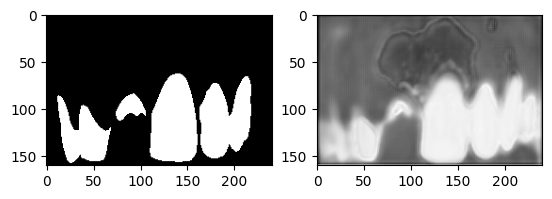

 95%|█████████▌| 60/63 [04:45<00:13,  4.59s/it]

Loss :  0.0075372812415783605 | LR :  [1.0000000000000002e-06]


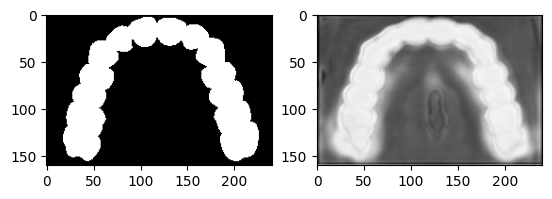

 48%|████▊     | 30/63 [02:22<02:37,  4.76s/it]

Loss :  0.007740704746296009 | LR :  [1.0000000000000002e-06]


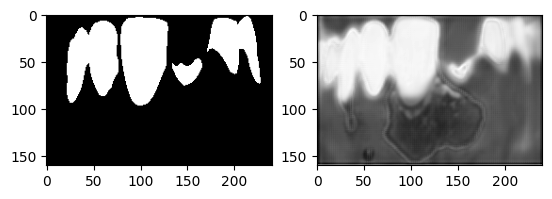

 95%|█████████▌| 60/63 [04:46<00:13,  4.55s/it]

Loss :  0.007536419791479906 | LR :  [1.0000000000000002e-06]


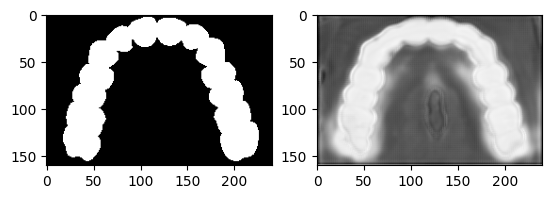

 48%|████▊     | 30/63 [02:21<02:37,  4.78s/it]

Loss :  0.0077405604689071575 | LR :  [1.0000000000000002e-06]


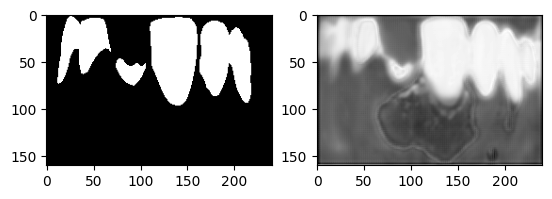

 95%|█████████▌| 60/63 [04:45<00:13,  4.58s/it]

Loss :  0.007536222296766937 | LR :  [1.0000000000000002e-06]


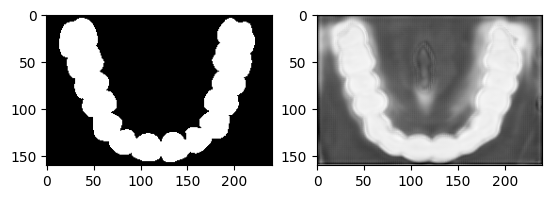

 48%|████▊     | 30/63 [02:22<02:43,  4.95s/it]

Loss :  0.007739684358239174 | LR :  [1.0000000000000002e-06]


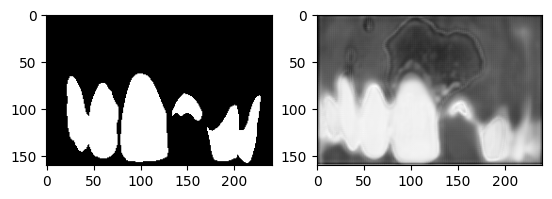

 95%|█████████▌| 60/63 [04:44<00:14,  4.77s/it]

Loss :  0.007535574849074086 | LR :  [1.0000000000000002e-06]


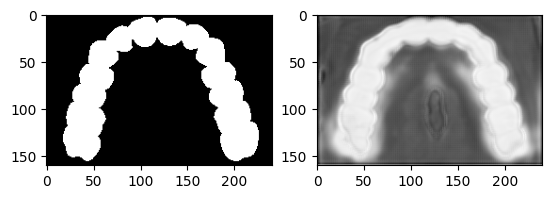

 48%|████▊     | 30/63 [02:21<02:37,  4.77s/it]

Loss :  0.00773908356204629 | LR :  [1.0000000000000002e-06]


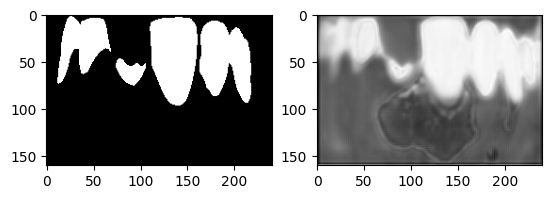

 95%|█████████▌| 60/63 [04:42<00:13,  4.52s/it]

Loss :  0.007534547227745255 | LR :  [1.0000000000000002e-06]


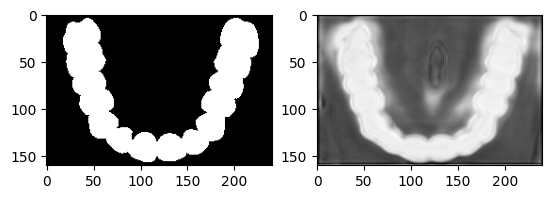

 48%|████▊     | 30/63 [02:21<02:45,  5.01s/it]

Loss :  0.0077402068767696616 | LR :  [1.0000000000000002e-06]


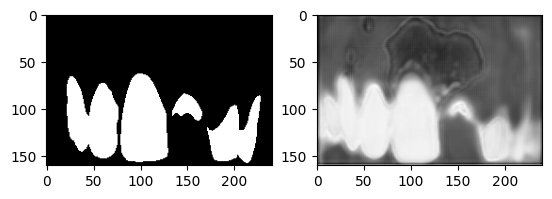

 95%|█████████▌| 60/63 [04:42<00:13,  4.44s/it]

Loss :  0.0075356002043311795 | LR :  [1.0000000000000002e-06]


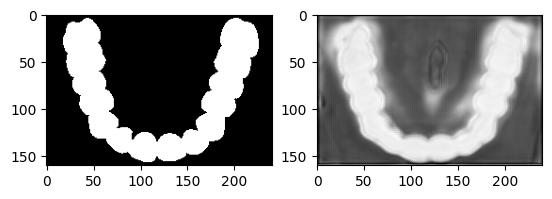

 48%|████▊     | 30/63 [02:21<02:41,  4.89s/it]

Loss :  0.007739309004197518 | LR :  [1.0000000000000002e-07]


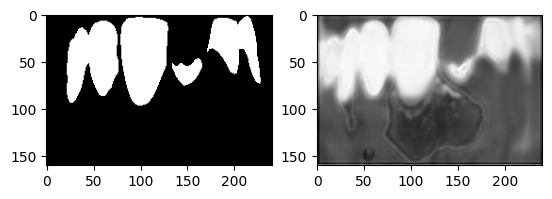

 95%|█████████▌| 60/63 [04:42<00:13,  4.61s/it]

Loss :  0.007534280295173327 | LR :  [1.0000000000000002e-07]


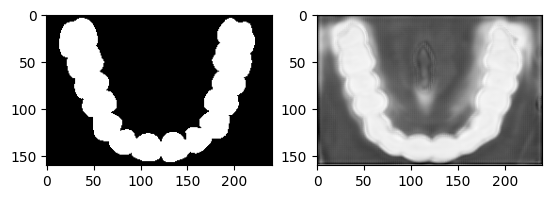

 48%|████▊     | 30/63 [02:21<02:40,  4.86s/it]

Loss :  0.0077393844723701475 | LR :  [1.0000000000000002e-07]


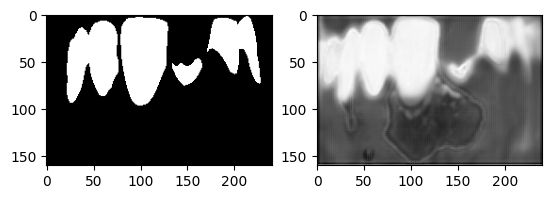

 95%|█████████▌| 60/63 [04:44<00:13,  4.66s/it]

Loss :  0.00753462421707809 | LR :  [1.0000000000000002e-07]


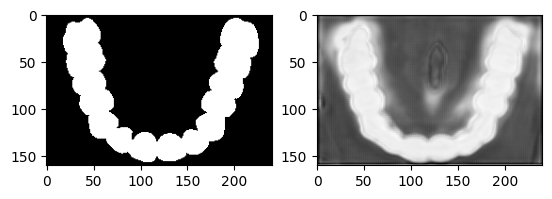

 48%|████▊     | 30/63 [02:20<02:39,  4.82s/it]

Loss :  0.007737811064968506 | LR :  [1.0000000000000002e-07]


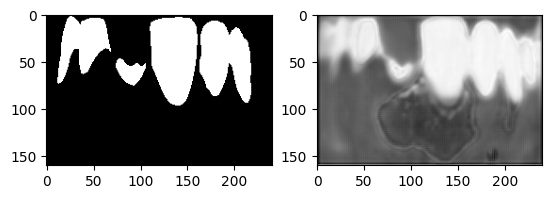

 95%|█████████▌| 60/63 [04:43<00:13,  4.62s/it]

Loss :  0.007534063483277956 | LR :  [1.0000000000000002e-07]


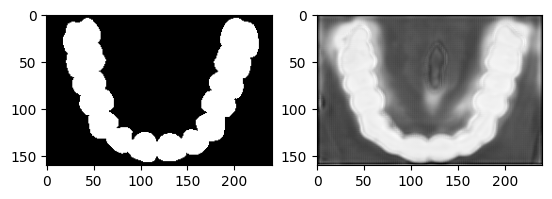

 48%|████▊     | 30/63 [02:22<02:45,  5.02s/it]

Loss :  0.007738082529976964 | LR :  [1.0000000000000002e-07]


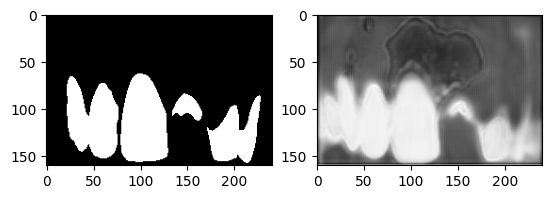

 95%|█████████▌| 60/63 [04:45<00:13,  4.61s/it]

Loss :  0.007533761967594425 | LR :  [1.0000000000000002e-07]


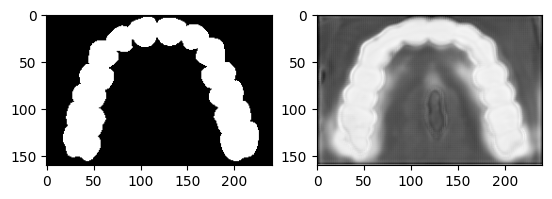

 48%|████▊     | 30/63 [02:22<02:41,  4.90s/it]

Loss :  0.007738565405209859 | LR :  [1.0000000000000002e-07]


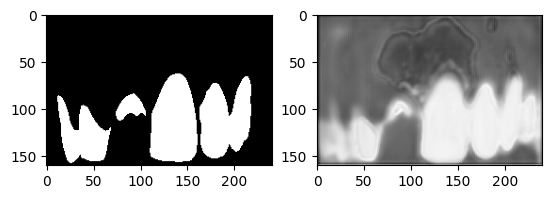

 95%|█████████▌| 60/63 [04:44<00:13,  4.48s/it]

Loss :  0.00753407539644589 | LR :  [1.0000000000000002e-07]


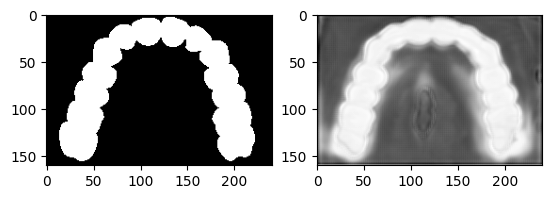

 48%|████▊     | 30/63 [02:24<02:42,  4.93s/it]

Loss :  0.007738683559000492 | LR :  [1.0000000000000002e-07]


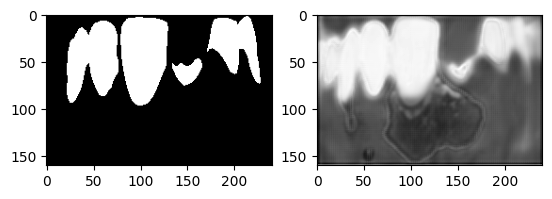

 95%|█████████▌| 60/63 [04:46<00:13,  4.58s/it]

Loss :  0.007534120705289146 | LR :  [1.0000000000000002e-07]


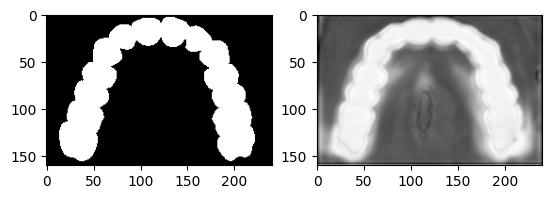

 48%|████▊     | 30/63 [02:19<02:38,  4.80s/it]

Loss :  0.007738390223433574 | LR :  [1.0000000000000002e-07]


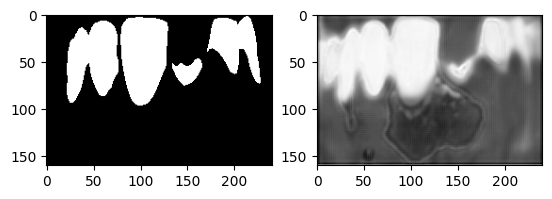

 95%|█████████▌| 60/63 [04:40<00:13,  4.51s/it]

Loss :  0.007533763349056244 | LR :  [1.0000000000000002e-07]


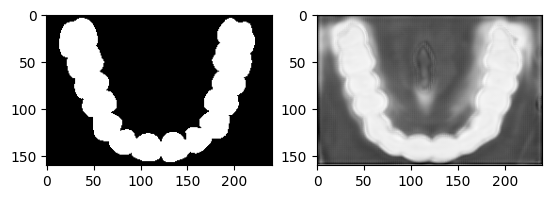

 48%|████▊     | 30/63 [02:19<02:40,  4.85s/it]

Loss :  0.007738502354671558 | LR :  [1.0000000000000002e-07]


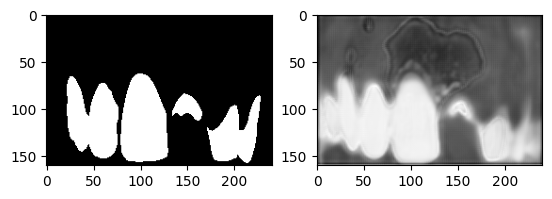

 95%|█████████▌| 60/63 [04:42<00:13,  4.63s/it]

Loss :  0.007534138897123436 | LR :  [1.0000000000000002e-07]


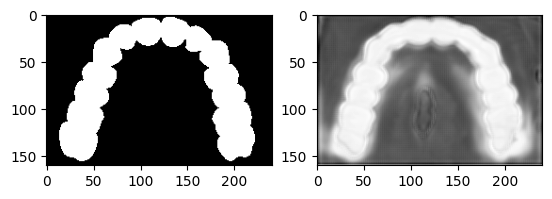

 48%|████▊     | 30/63 [02:20<02:38,  4.82s/it]

Loss :  0.007738726881022255 | LR :  [1.0000000000000002e-07]


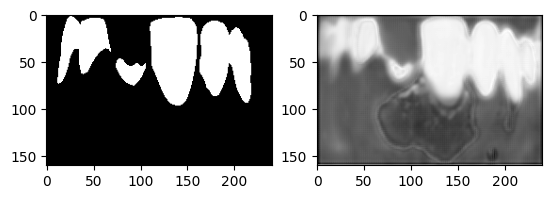

 95%|█████████▌| 60/63 [04:41<00:13,  4.53s/it]

Loss :  0.007533896442813178 | LR :  [1.0000000000000002e-07]


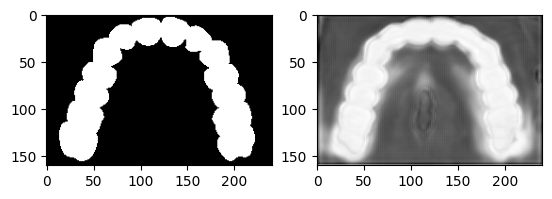

 48%|████▊     | 30/63 [02:21<02:37,  4.78s/it]

Loss :  0.007738066340486209 | LR :  [1.0000000000000002e-07]


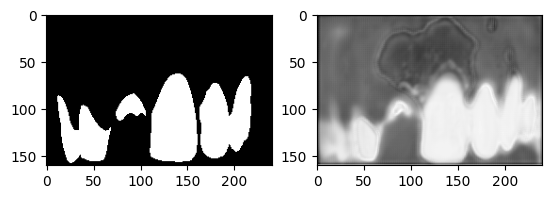

 95%|█████████▌| 60/63 [04:44<00:14,  4.72s/it]

Loss :  0.007533428297999005 | LR :  [1.0000000000000002e-07]


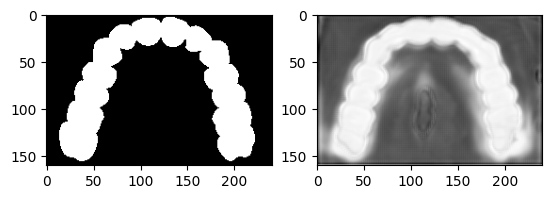

 48%|████▊     | 30/63 [02:20<02:40,  4.85s/it]

Loss :  0.007738325372338295 | LR :  [1.0000000000000002e-07]


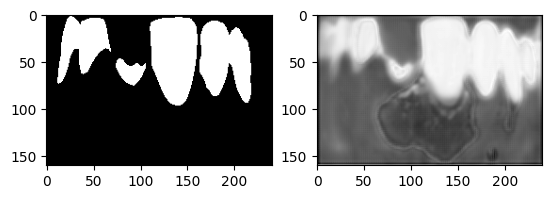

 95%|█████████▌| 60/63 [04:43<00:13,  4.55s/it]

Loss :  0.007534040627069772 | LR :  [1.0000000000000002e-07]


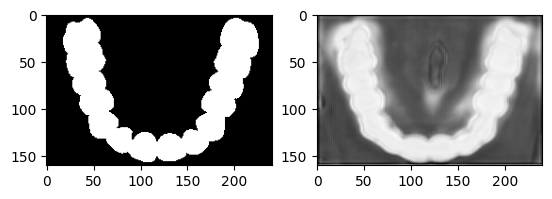

 48%|████▊     | 30/63 [02:22<02:45,  5.00s/it]

Loss :  0.007737313769757748 | LR :  [1.0000000000000002e-07]


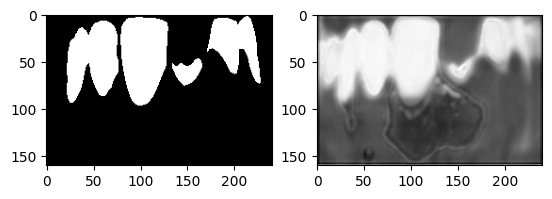

 95%|█████████▌| 60/63 [04:46<00:13,  4.58s/it]

Loss :  0.007533333349662523 | LR :  [1.0000000000000002e-07]


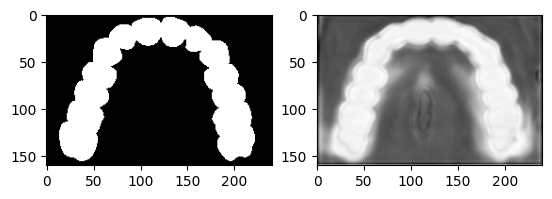

 48%|████▊     | 30/63 [02:22<02:38,  4.80s/it]

Loss :  0.007737483968958259 | LR :  [1.0000000000000002e-07]


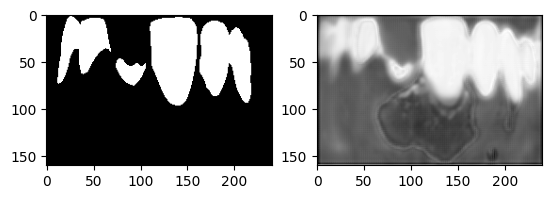

 95%|█████████▌| 60/63 [04:45<00:13,  4.63s/it]

Loss :  0.0075333974712217845 | LR :  [1.0000000000000002e-07]


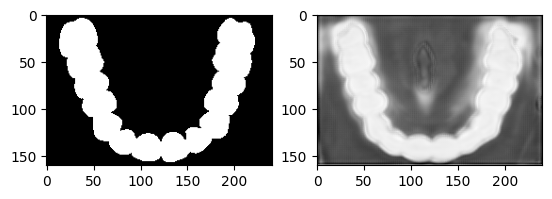

 48%|████▊     | 30/63 [02:23<02:42,  4.93s/it]

Loss :  0.007737537783881029 | LR :  [1.0000000000000002e-07]


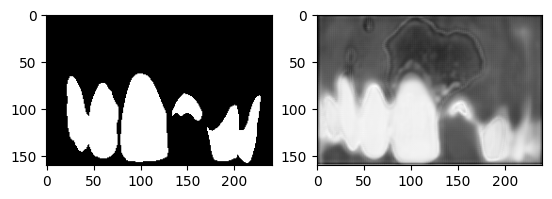

 95%|█████████▌| 60/63 [04:44<00:13,  4.46s/it]

Loss :  0.007533066160976887 | LR :  [1.0000000000000002e-07]


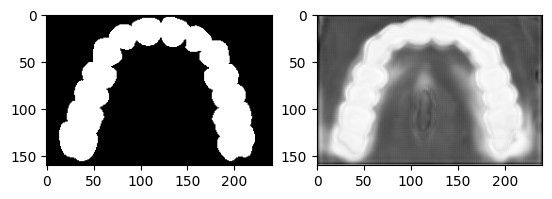

 48%|████▊     | 30/63 [02:22<02:44,  5.00s/it]

Loss :  0.0077374449154982965 | LR :  [1.0000000000000002e-07]


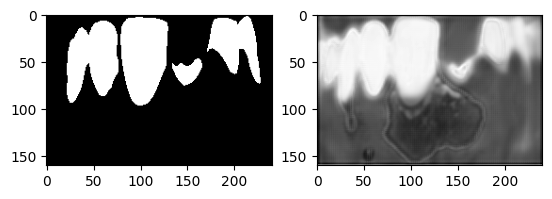

 95%|█████████▌| 60/63 [04:42<00:13,  4.51s/it]

Loss :  0.007533428057407339 | LR :  [1.0000000000000002e-07]


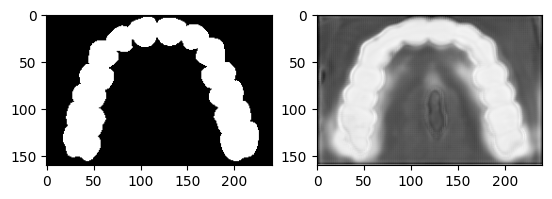

 48%|████▊     | 30/63 [02:21<02:38,  4.82s/it]

Loss :  0.007738028513267636 | LR :  [1.0000000000000002e-07]


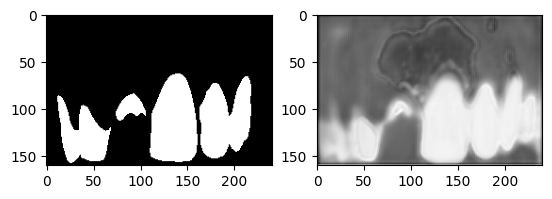

 95%|█████████▌| 60/63 [04:44<00:13,  4.58s/it]

Loss :  0.0075335136769960325 | LR :  [1.0000000000000002e-07]


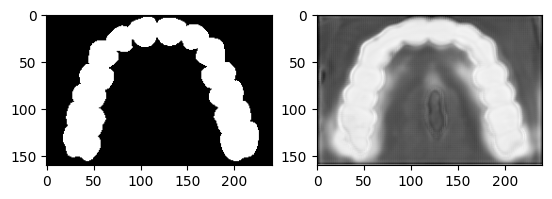

 48%|████▊     | 30/63 [02:20<02:37,  4.78s/it]

Loss :  0.007737941031033794 | LR :  [1.0000000000000002e-07]


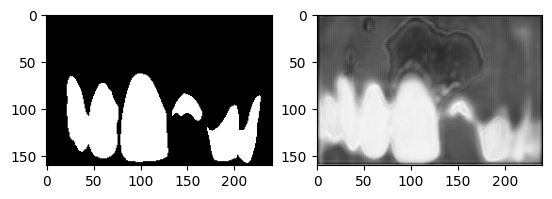

 95%|█████████▌| 60/63 [04:42<00:14,  4.70s/it]

Loss :  0.007533230989550551 | LR :  [1.0000000000000002e-07]


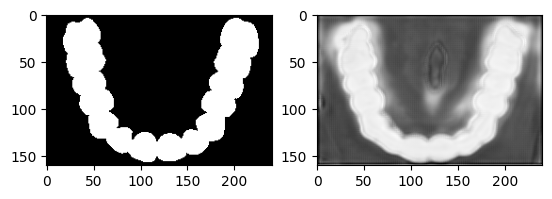

 48%|████▊     | 30/63 [02:20<02:37,  4.78s/it]

Loss :  0.007737264937410752 | LR :  [1.0000000000000002e-07]


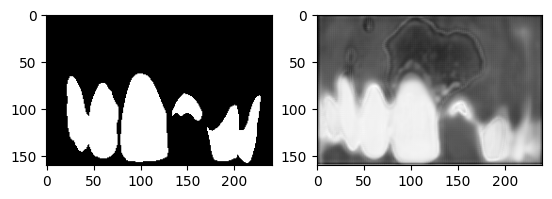

 95%|█████████▌| 60/63 [04:42<00:13,  4.63s/it]

Loss :  0.007533260085619986 | LR :  [1.0000000000000002e-07]


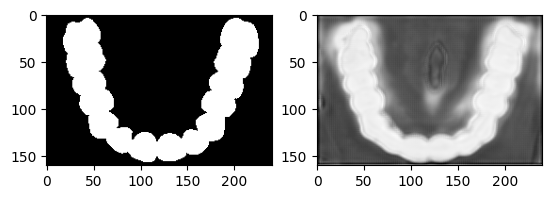

 48%|████▊     | 30/63 [02:22<02:41,  4.88s/it]

Loss :  0.007737615782146653 | LR :  [1.0000000000000002e-07]


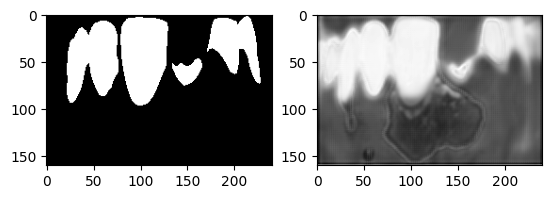

 95%|█████████▌| 60/63 [04:43<00:13,  4.57s/it]

Loss :  0.007533180046205719 | LR :  [1.0000000000000002e-07]


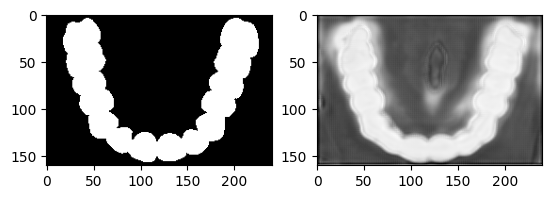

 48%|████▊     | 30/63 [02:20<02:40,  4.86s/it]

Loss :  0.0077376952084402244 | LR :  [1.0000000000000002e-07]


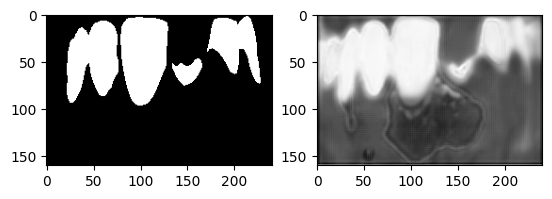

 95%|█████████▌| 60/63 [04:43<00:13,  4.60s/it]

Loss :  0.007533222444665929 | LR :  [1.0000000000000002e-07]


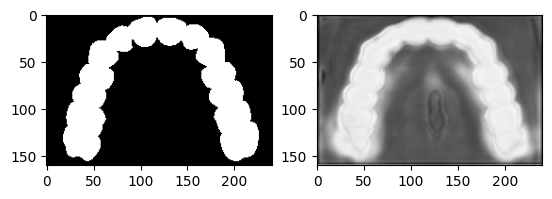

 48%|████▊     | 30/63 [02:20<02:37,  4.76s/it]

Loss :  0.007736740835631887 | LR :  [1.0000000000000002e-07]


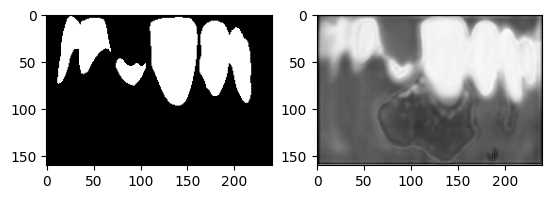

 95%|█████████▌| 60/63 [04:42<00:13,  4.64s/it]

Loss :  0.0075328488678981865 | LR :  [1.0000000000000002e-07]


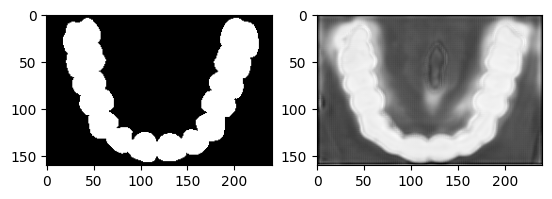

 48%|████▊     | 30/63 [02:22<02:40,  4.87s/it]

Loss :  0.0077369028702378275 | LR :  [1.0000000000000002e-07]


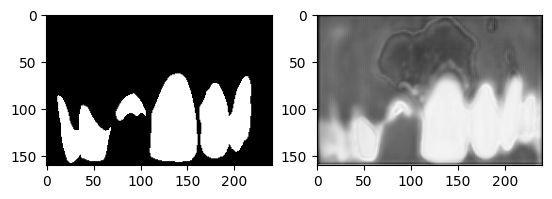

 95%|█████████▌| 60/63 [04:45<00:13,  4.63s/it]

Loss :  0.007532694198501607 | LR :  [1.0000000000000002e-07]


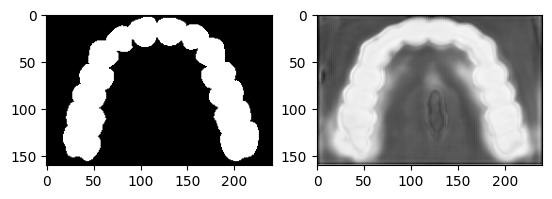

 48%|████▊     | 30/63 [02:22<02:42,  4.93s/it]

Loss :  0.007737162228052815 | LR :  [1.0000000000000002e-07]


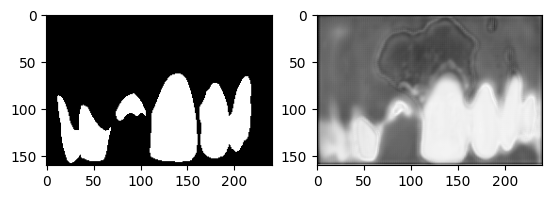

 95%|█████████▌| 60/63 [04:43<00:13,  4.52s/it]

Loss :  0.007532577395128707 | LR :  [1.0000000000000002e-07]


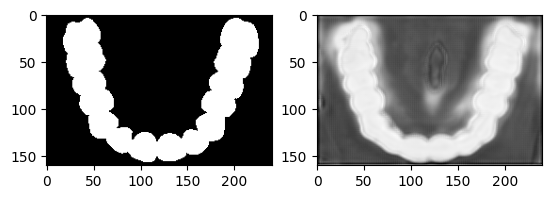

 48%|████▊     | 30/63 [02:21<02:37,  4.76s/it]

Loss :  0.007736935435483853 | LR :  [1.0000000000000002e-07]


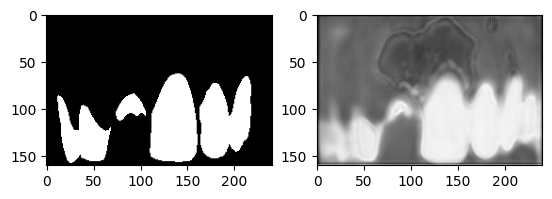

 95%|█████████▌| 60/63 [04:44<00:13,  4.53s/it]

Loss :  0.007532594089085857 | LR :  [1.0000000000000002e-07]


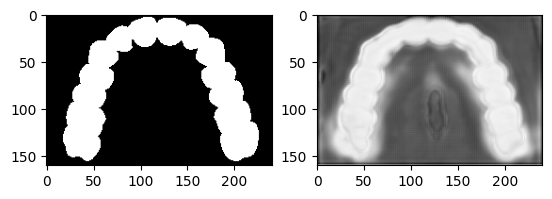

 48%|████▊     | 30/63 [02:21<02:42,  4.92s/it]

Loss :  0.00773677839897573 | LR :  [1.0000000000000002e-07]


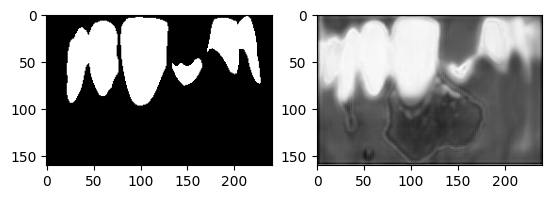

 95%|█████████▌| 60/63 [04:43<00:14,  4.69s/it]

Loss :  0.007532308615433673 | LR :  [1.0000000000000002e-07]


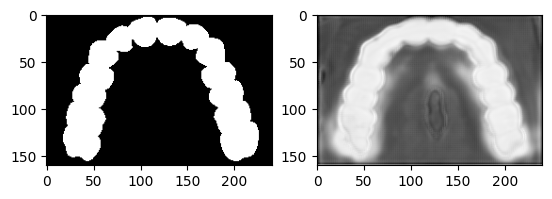

 48%|████▊     | 30/63 [02:20<02:34,  4.70s/it]

Loss :  0.007737662581106027 | LR :  [1.0000000000000002e-07]


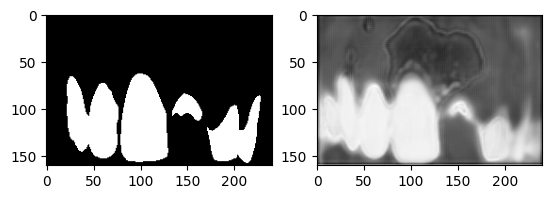

 95%|█████████▌| 60/63 [04:42<00:13,  4.56s/it]

Loss :  0.007532701462817689 | LR :  [1.0000000000000002e-07]


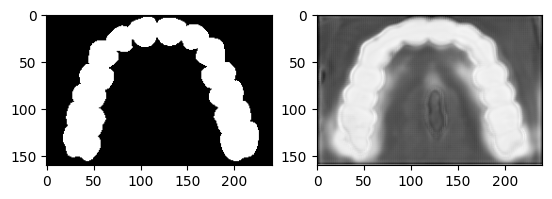

 48%|████▊     | 30/63 [02:19<02:41,  4.88s/it]

Loss :  0.007736928155645728 | LR :  [1.0000000000000002e-07]


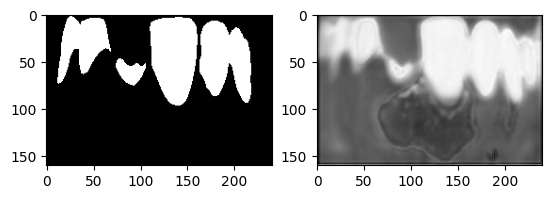

 95%|█████████▌| 60/63 [04:39<00:13,  4.52s/it]

Loss :  0.007532689999788999 | LR :  [1.0000000000000002e-07]


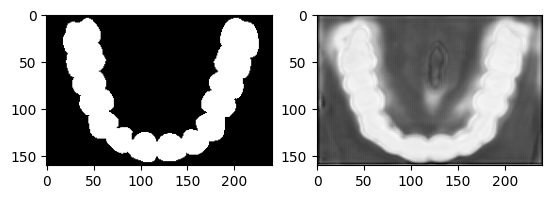

 48%|████▊     | 30/63 [02:20<02:41,  4.88s/it]

Loss :  0.007737042522057891 | LR :  [1.0000000000000002e-07]


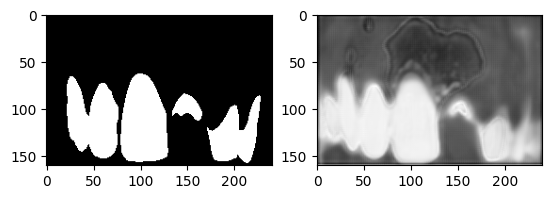

 95%|█████████▌| 60/63 [04:43<00:13,  4.51s/it]

Loss :  0.007532853415856759 | LR :  [1.0000000000000002e-07]


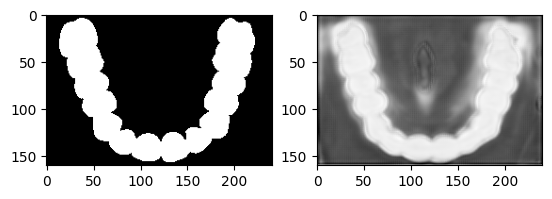

 48%|████▊     | 30/63 [02:21<02:40,  4.86s/it]

Loss :  0.007736728930224975 | LR :  [1.0000000000000002e-07]


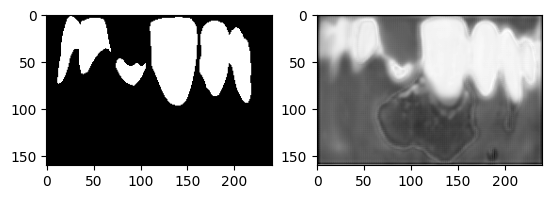

 95%|█████████▌| 60/63 [04:43<00:14,  4.74s/it]

Loss :  0.0075325337859491505 | LR :  [1.0000000000000002e-07]


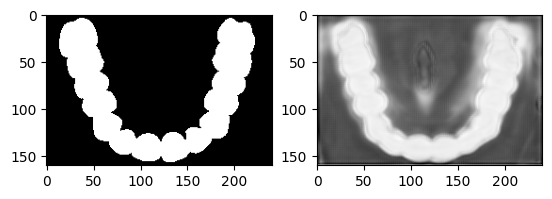

 48%|████▊     | 30/63 [02:20<02:36,  4.75s/it]

Loss :  0.0077365015478183825 | LR :  [1.0000000000000002e-07]


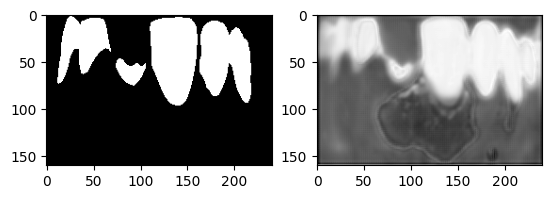

 95%|█████████▌| 60/63 [04:44<00:14,  4.70s/it]

Loss :  0.00753185988869518 | LR :  [1.0000000000000002e-07]


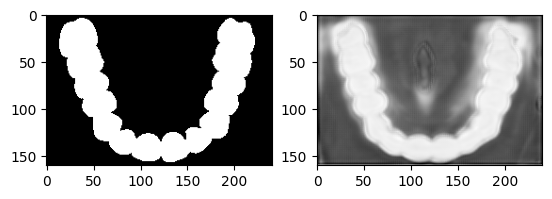

 48%|████▊     | 30/63 [02:21<02:40,  4.87s/it]

Loss :  0.007736140225703517 | LR :  [1.0000000000000002e-07]


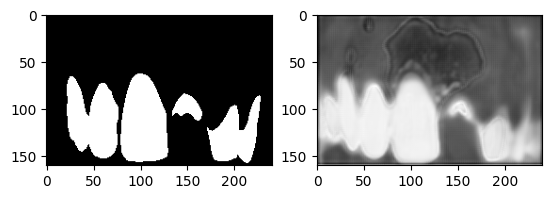

 95%|█████████▌| 60/63 [04:43<00:13,  4.61s/it]

Loss :  0.0075323586196949085 | LR :  [1.0000000000000002e-07]


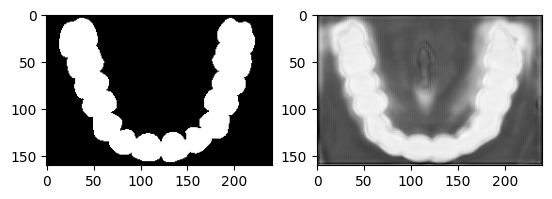

 48%|████▊     | 30/63 [02:19<02:37,  4.77s/it]

Loss :  0.00773629251246651 | LR :  [1.0000000000000002e-07]


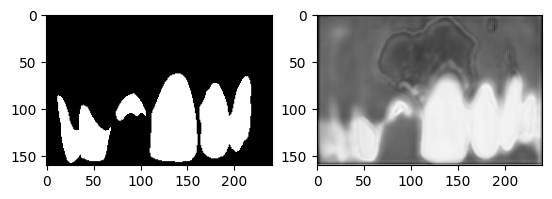

 95%|█████████▌| 60/63 [04:40<00:13,  4.46s/it]

Loss :  0.007532013254240156 | LR :  [1.0000000000000002e-07]


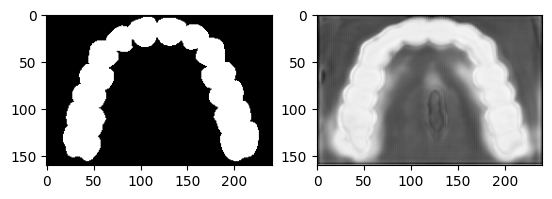

 48%|████▊     | 30/63 [02:21<02:38,  4.79s/it]

Loss :  0.0077362450150152045 | LR :  [1.0000000000000002e-07]


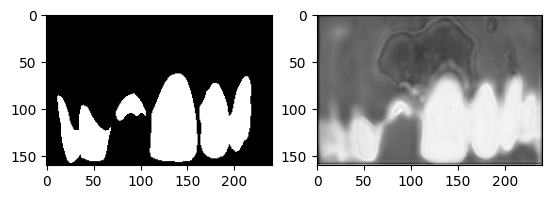

 95%|█████████▌| 60/63 [04:43<00:13,  4.58s/it]

Loss :  0.007532213279046118 | LR :  [1.0000000000000002e-07]


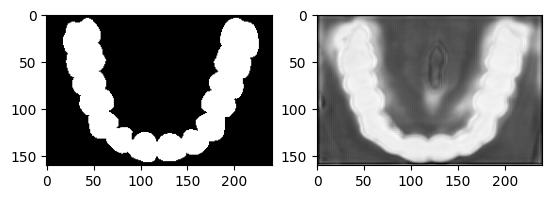

 48%|████▊     | 30/63 [02:21<02:41,  4.90s/it]

Loss :  0.007736921558777491 | LR :  [1.0000000000000002e-07]


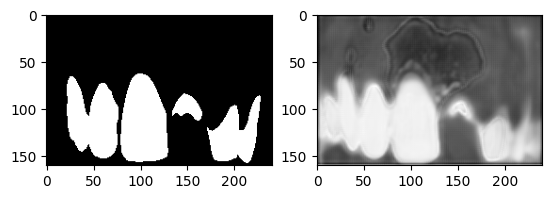

 95%|█████████▌| 60/63 [04:43<00:13,  4.63s/it]

Loss :  0.007532509455146889 | LR :  [1.0000000000000002e-07]


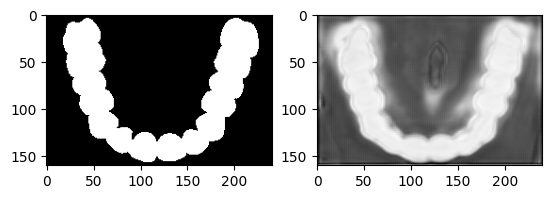

 48%|████▊     | 30/63 [02:20<02:37,  4.77s/it]

Loss :  0.007736119550342361 | LR :  [1.0000000000000002e-07]


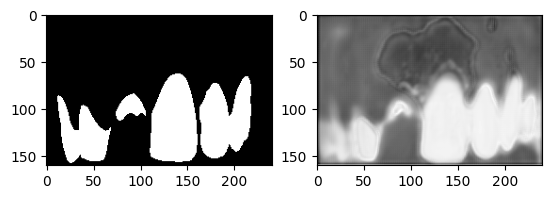

 95%|█████████▌| 60/63 [04:41<00:13,  4.52s/it]

Loss :  0.007531748766389986 | LR :  [1.0000000000000002e-07]


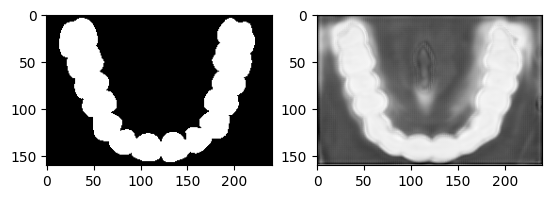

100%|██████████| 63/63 [04:51<00:00,  4.63s/it]

[0.07175617455135262, 0.008569216813951258, 0.008029684335702942, 0.007785459832539634, 0.007655750036180493, 0.007579648542025733, 0.007551952073025325, 0.007538377750842344, 0.007525755144241784, 0.00751334870795882, 0.007499561955531438, 0.007487854040745232, 0.007475474989780831, 0.007463176002992051, 0.0074519919497626165, 0.007432815958819692, 0.007428397003206469, 0.007425164922125756, 0.007423348717450622, 0.00742136686301184, 0.007418987186004718, 0.00741709941732032, 0.007415665387515984, 0.007413822048831554, 0.007411151902661437, 0.007410046533637103, 0.00740752417948984, 0.007405370769519654, 0.007403577086589639, 0.0074010503123558705, 0.007399196440856608, 0.007397271404486327, 0.007394694397965121, 0.007392384052749664, 0.007389622481746806, 0.0073866151228901885, 0.00738534103665087, 0.007384530290783871, 0.007385518172726271, 0.007385115981811569, 0.0073842195838335015, 0.0073839328030035605, 0.007384515005267329, 0.007382974664251956, 0.007383009899289362, 0.00738252

In [226]:
EPOCHS = 100

all_losses = []
for e in range(EPOCHS):

    l_d = train_step()
    
    lr_scheduler.step()
    
    all_losses.append(l_d)

    if e % 10 == 0:
        with open(f"model_weights{e}.pth", 'wb') as file:
            torch.save(model.state_dict(), file)

print(all_losses)

In [227]:
with torch.inference_mode():
  torch.cuda.empty_cache()